In [97]:
import pandas as pd 
import numpy as np

import plotly.express as px
import matplotlib.pyplot as plt
import seaborn as sns

from wooldridge import *
import statsmodels.formula.api as smf

import optuna

# importando as funções Stratified K-Fold e train_test_split
from sklearn.model_selection import train_test_split, StratifiedKFold, cross_val_score

from sklearn.preprocessing import PolynomialFeatures

# Importando a função para feature importance
from sklearn.inspection import permutation_importance

# importando as funções para calcular o MSE, MAE e R2
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score, mean_absolute_percentage_error, make_scorer

from sklearn.model_selection import KFold

# Encoder para tratamento de variáveis categóricas
from sklearn.preprocessing import OneHotEncoder

# Importando os modelos de Regressão
from sklearn.linear_model import LinearRegression
from xgboost import XGBRegressor
from sklearn.ensemble import RandomForestRegressor
from catboost import CatBoostRegressor, Pool


In [5]:
df = pd.read_csv(r'C:\Users\Victor Fonteles\Documents\Train_Data.csv')


## Primeiras impressões dos dados

In [7]:
df.head()

,age,sex,bmi,smoker,region,children,charges
0,21.000000,male,25.745000,no,northeast,2,3279.868550
1,36.976978,female,25.744165,yes,southeast,3,21454.494239
2,18.000000,male,30.030000,no,southeast,1,1720.353700
3,37.000000,male,30.676891,no,northeast,3,6801.437542
4,58.000000,male,32.010000,no,southeast,1,11946.625900


In [88]:
rows, columns = df.shape
print(f'{rows} linhas e {columns}')

3630 linhas e 8


In [64]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3630 entries, 0 to 3629
Data columns (total 7 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   age       3630 non-null   float64
 1   sex       3630 non-null   object 
 2   bmi       3630 non-null   float64
 3   smoker    3630 non-null   object 
 4   region    3630 non-null   object 
 5   children  3630 non-null   int64  
 6   charges   3630 non-null   float64
dtypes: float64(3), int64(1), object(3)
memory usage: 198.6+ KB


In [10]:
df.describe()

,age,bmi,children,charges
count,3630.000000,3630.000000,3630.000000,3630.000000
mean,38.887036,30.629652,2.503581,12784.808644
std,12.151029,5.441307,1.712568,10746.166743
min,18.000000,15.960000,0.000000,1121.873900
25%,29.000000,26.694526,1.000000,5654.818262
50%,39.170922,30.200000,3.000000,9443.807222
75%,48.343281,34.100000,4.000000,14680.407505
max,64.000000,53.130000,5.000000,63770.428010


#### Observando as estatisticas descritivas, as despesas médicas mais altas se concentram no Q4 (quarto quartil), sendo o valor maximo 
#### 63.770 dólares e a média de 12.784 dólares.

In [89]:
# Percentual de dados nulos por coluna

percentual_valores_nulos = ((df.isnull().sum()/rows)*100).round(2)
percentual_valores_nulos

age            0.00
sex            0.00
bmi            0.00
smoker         0.00
region         0.00
children       0.00
charges        0.00
age_quantile   0.00
dtype: float64

In [184]:
df['sex'].value_counts().reset_index()


,sex,count
0,male,2029
1,female,1601


In [185]:
region_counts = df['region'].value_counts().reset_index()
region_counts.columns = ['region', 'contagem']
region_counts

,region,contagem
0,southeast,1021
1,northwest,911
2,southwest,850
3,northeast,848


#### Vemos que a distribuição de instâncias por região e por sexo são balanceadas
#### A região com mais pessoas seguradas pelo plano de saúde é southeast

In [60]:
# Média de gastos por região
average_price_per_region = df.groupby('region')['charges'].mean().reset_index()

average_price_per_region


,region,charges
0,northeast,14971.019505
1,northwest,11985.709166
2,southeast,13655.955548
3,southwest,10413.787260


In [65]:
# Gráfico de barras para mostrar a Média de gastos por região

fig = px.bar(average_price_per_region, x='region', y='charges', color='region',
            text='region', title='Média de gastos por região',
            labels={'charges':'Média de Gastos', 'region':'Região'})

fig.update_layout(width=650, height=400)          
fig.update_traces(textposition='outside',  textfont_size=12)
fig.show()

#### Com o violinplot, observa-se que muitos gastos em todas as regiões se concentram em um nível abaixo de 20.000 dólares.
#### Alem disso, vemos que a diferença entre as médias de gastos entre as regiões fica mais visível pela maior concentração de gastos um pouco acima do nivel de 30.000 dólares 
#### nas regiões de northeast e southeast

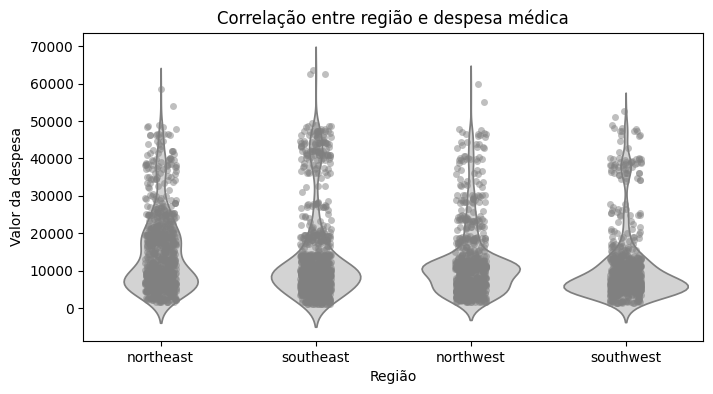

In [58]:
plt.figure(figsize=(8,4))


sns.violinplot(x='region', y='charges', data=df, inner=None, color='lightgray')
sns.stripplot(x='region', y='charges', data=df, jitter=True, alpha=0.5,color='gray') #Para visualizar os pontos individuais.
plt.title('Correlação entre região e despesa médica')
plt.xlabel('Região')
plt.ylabel('Valor da despesa')
plt.show()

### Abaixo, algo curioso:
#### Pessoas com 5 e 4 filhos têm uma média de despesas médicas menor em relação a pessoas com menos filhos

In [91]:
# Média de gastos por região
average_price_per_children = df.groupby('children')['charges'].mean().reset_index()

average_price_per_children

,children,charges
0,0,"12,486.98"
1,1,"12,215.28"
2,2,"14,762.31"
3,3,"15,620.33"
4,4,"13,069.11"
5,5,"8,538.26"


### No gráfico abaixo, algo interessante:
#### De 1 a 3 filhos, temos um aumento gradativo na média das despesas.
#### No entanto, do 3° ao 5° filho a média diminui gradativamente !

In [92]:
# Gráfico de barras para mostrar 

fig = px.bar(average_price_per_children, x='children', y='charges', color='children',
            text='children', title='Média de Despesa médica por N° de filhos',
            labels={'charges':'Média de Gastos', 'children':'Children'})

fig.update_layout(width=650, height=400)                      
fig.update_traces(textposition='outside',  textfont_size=12)
fig.show()

#### Já na violin plot abaixo, vemos que de 0 a 3 filhos, temos casos de despesas outliers mais frequentes, além de maior concentração na faixa dos 40.000 dólares
#### em relação a 4 ou 5 filhos. Nenhum segurado com 5 filhos teve gastos acima de 20.000 dolares

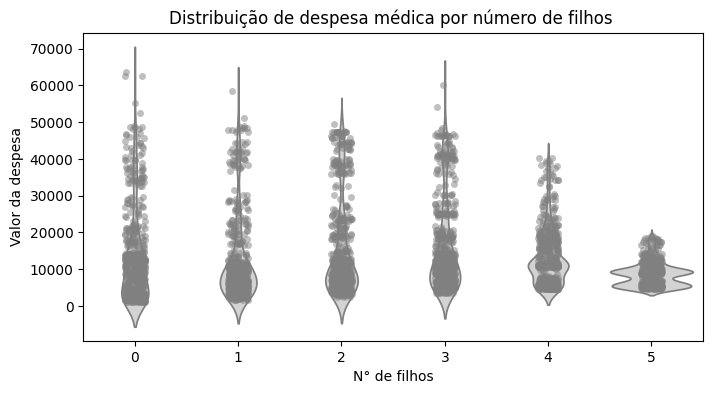

In [57]:
plt.figure(figsize=(8,4))


sns.violinplot(x='children', y='charges', data=df, inner=None, color='lightgray')
sns.stripplot(x='children', y='charges', data=df, jitter=True, alpha=0.5,color='gray') #Para visualizar os pontos individuais.
plt.title('Distribuição de despesa médica por número de filhos ')
plt.xlabel('N° de filhos')
plt.ylabel('Valor da despesa')
plt.show()

#### Não é a toa que temos a variável de fumantes disponível
#### Vamos ver se o marketing reverso do cigarro é demasiadamente escandaloso

<Axes: xlabel='children', ylabel='count'>

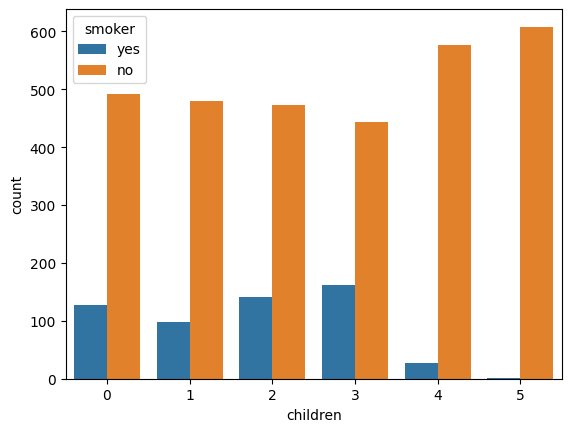

In [192]:
# Distribuição de fumantes para nuémero de filhos

sns.countplot(data=df,x='children', hue='smoker')

### Bingo! A variação do número de fumantes por filho se comporta de forma similar da média de gastos por número de filhos.
#### Pessoas com 5 filhos e fumam beiram à zero.
#### Além disso, vemos que a distribuição de segurados por filhos também está balanceada

<Axes: xlabel='sex', ylabel='count'>

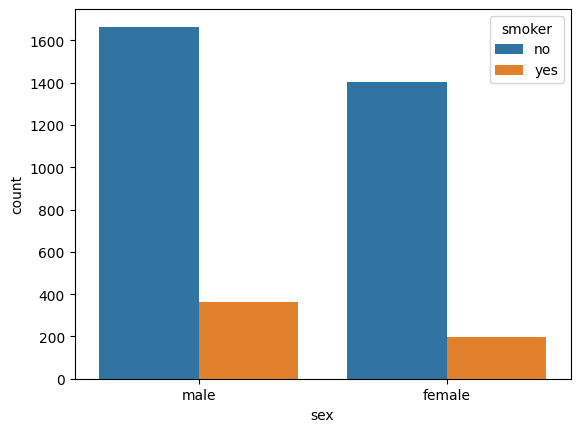

In [193]:
# Distribuição de fumantes entre sexos

sns.countplot(data=df,x='sex', hue='smoker')

#### Homens fumam mais 

In [194]:
smoker_counts = df['smoker'].value_counts().reset_index()
smoker_counts

,smoker,count
0,no,3070
1,yes,560


#### Com a matriz de correlação abaixo, vemos que a idade e bmi (Índice de massa corporal)  possuem correlação com o gasto médico.
#### Tambêm, pode-se dizer que a idade influencia no Índice de massa corporal.

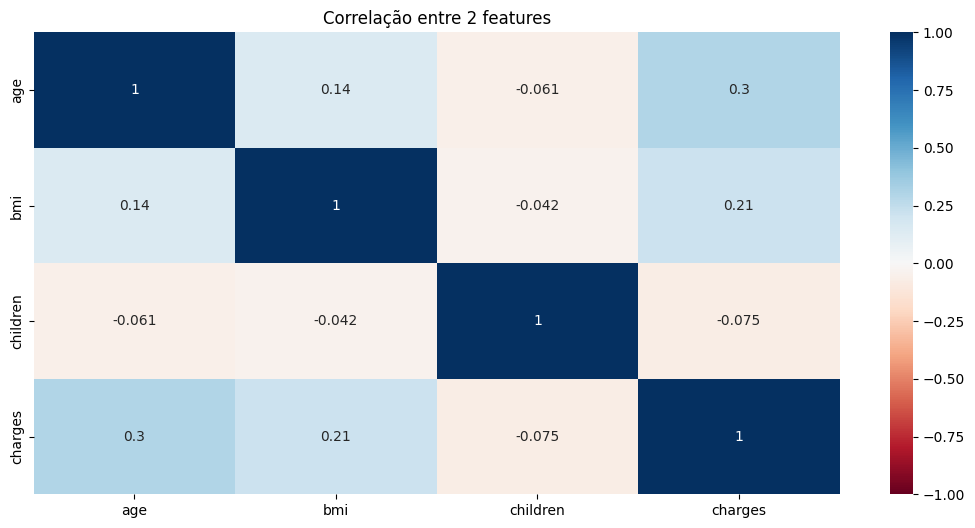

In [55]:
plt.figure(figsize=(13,6))
plt.title('Correlação entre 2 features')
sns.heatmap(df.select_dtypes(include=['number']).corr(), annot = True, vmin=-1, vmax=1, cmap='RdBu')
plt.show()

### Criando gráficos de dispersão com uma reta de regressão

O sns.regplot do Seaborn é uma função que combina duas funcionalidades principais:

- Scatter Plot (Gráfico de Dispersão): Ele plota os pontos de dados, mostrando a relação entre duas variáveis numéricas.

- Regressão Linear: Ele automaticamente ajusta um modelo de regressão linear aos dados e plota a reta de regressão resultante, juntamente com um intervalo de confiança (por padrão).

### O que a Reta Significa:

#### A reta que o sns.regplot plota é a reta de regressão linear ajustada aos dados. Ela representa a melhor aproximação linear da relação entre as variáveis x e y, no sentido de minimizar o erro quadrático médio (MSE).

In [ ]:
- Inclinação Positiva (w1 > 0): Indica uma relação positiva entre x e y. À medida que x aumenta, y tende a aumentar.

- Inclinação Negativa (w1 < 0): Indica uma relação negativa entre x e y. À medida que x aumenta, y tende a diminuir.

- Inclinação Próxima de Zero (w1 ≈ 0): Indica que não há uma relação linear forte entre x e y.

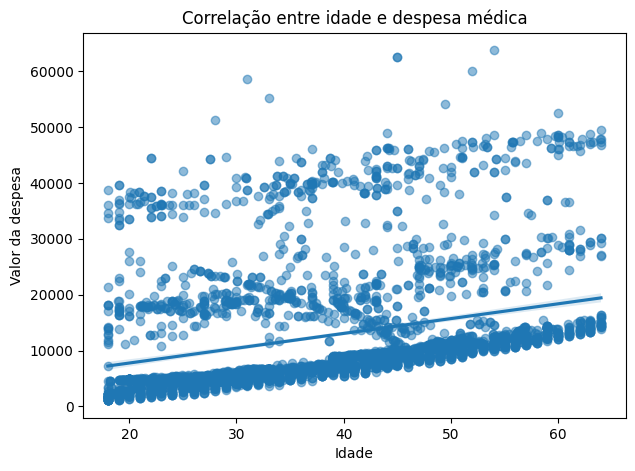

In [54]:
plt.figure(figsize=(7,5))
sns.regplot(x='age', y='charges', data=df, scatter_kws={'alpha':0.5})

plt.title('Correlação entre idade e despesa médica')
plt.xlabel('Idade')
plt.ylabel('Valor da despesa')
plt.show()

### A inclinação positiva da reta demonstra que os dispesas médicas aumentam conforme a progressão da idade
### Existem 3 regiões na escala das despesas em que há maiores ocorrencias, possivelmente devido a outros fatores além da idade.

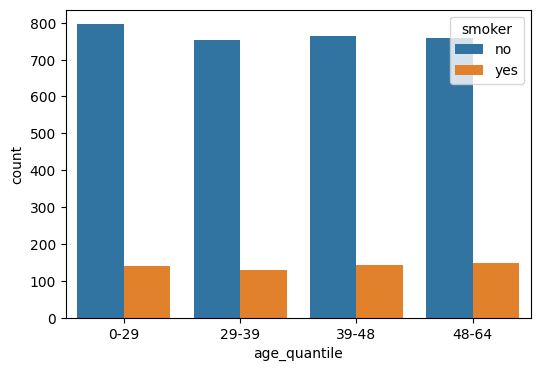

In [53]:
# Distribuição de fumantes entre por idade

df_temp = df

# Divide em 4 quantis (quartis, por exemplo)
df_temp['age_quantile'] = pd.qcut(df['age'], q=4, labels=['0-29', '29-39', '39-48', '48-64'])

plt.figure(figsize=(6, 4))
sns.countplot(data=df_temp, x='age_quantile', hue='smoker')
plt.show()

### A quantidade de fumantes por grupos de idade está bem distribuída, não havendo um aumento de fumantes com a progressão da idade

In [229]:
df = df.drop(columns= ['age_quantile'])


In [230]:
df.head()

,age,sex,bmi,smoker,region,children,charges
0,21.000000,male,25.745000,no,northeast,2,3279.868550
1,36.976978,female,25.744165,yes,southeast,3,21454.494239
2,18.000000,male,30.030000,no,southeast,1,1720.353700
3,37.000000,male,30.676891,no,northeast,3,6801.437542
4,58.000000,male,32.010000,no,southeast,1,11946.625900


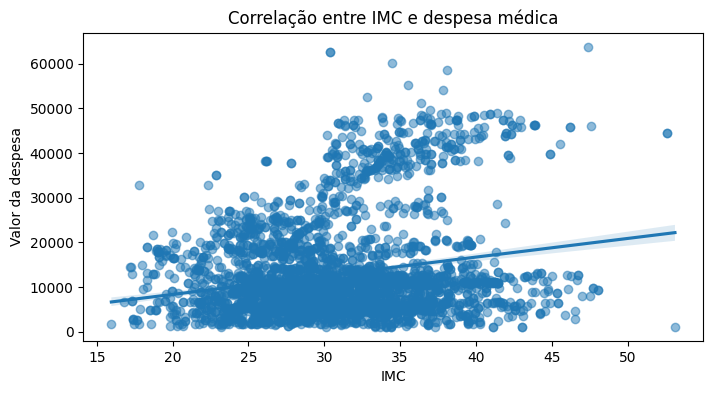

In [51]:
plt.figure(figsize=(8,4))
sns.regplot(x='bmi', y='charges', data=df, scatter_kws={'alpha':0.5})

plt.title('Correlação entre IMC e despesa médica')
plt.xlabel('IMC')
plt.ylabel('Valor da despesa')
plt.show()

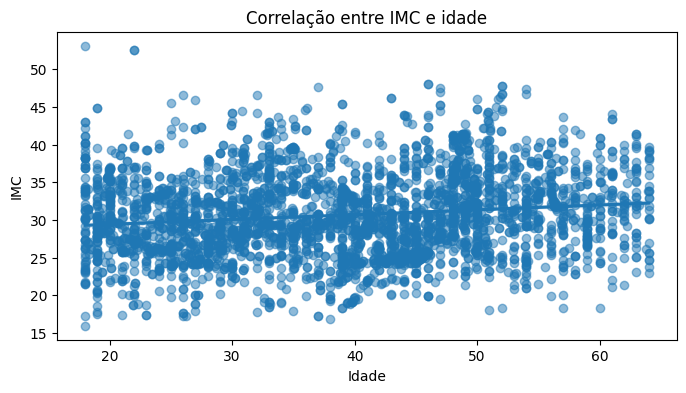

In [52]:
plt.figure(figsize=(8,4))
sns.regplot(x='age', y='bmi', data=df, scatter_kws={'alpha':0.5})

plt.title('Correlação entre IMC e idade')
plt.xlabel('Idade')
plt.ylabel('IMC')
plt.show()

### Apesar da distribuição do IMC ser muito aleatória em relação a idade, a inclinação positiva da reta demonstra a tendência de aumento no peso conforme a idade

In [231]:
filtered_df_31 = df[(df['children'] == 0) & (df['smoker'] == 'no') & (df['bmi'] > 31) & (df['age'] < 45)]
mean_charges_per_bmi_31 = filtered_df_31['charges'].mean()

filtered_df = df[(df['children'] == 0) & (df['smoker'] == 'no') & (df['bmi'] < 31) & (df['age'] < 45)]
mean_charges_per_bmi = filtered_df['charges'].mean()


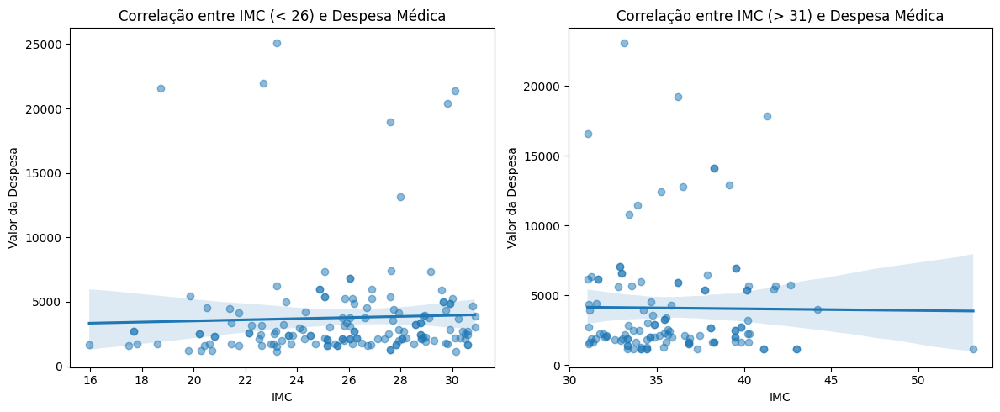

In [236]:
# --- Criar a figura e os subplots ---
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(12, 5))  # 1 linha, 2 colunas, ajuste o figsize

# --- Primeiro Gráfico (IMC < 26) ---
sns.regplot(x='bmi', y='charges', data=filtered_df, scatter_kws={'alpha': 0.5}, ax=axes[0])
axes[0].set_title('Correlação entre IMC (< 26) e Despesa Médica')
axes[0].set_xlabel('IMC')
axes[0].set_ylabel('Valor da Despesa')


# --- Segundo Gráfico (IMC > 31) ---
sns.regplot(x='bmi', y='charges', data=filtered_df_31, scatter_kws={'alpha': 0.5}, ax=axes[1])
axes[1].set_title('Correlação entre IMC (> 31) e Despesa Médica')
axes[1].set_xlabel('IMC')
axes[1].set_ylabel('Valor da Despesa')

# --- Ajustar o layout para evitar sobreposição ---
plt.tight_layout()

# --- Exibir a figura ---
plt.show()

In [46]:
filtered_df_to_age = df[(df['children'] == 0) & (df['smoker'] == 'no')]
filtered_df_to_age_with_bmi = df[(df['children'] == 0) & (df['smoker'] == 'no') & (df['bmi'] < 25)]


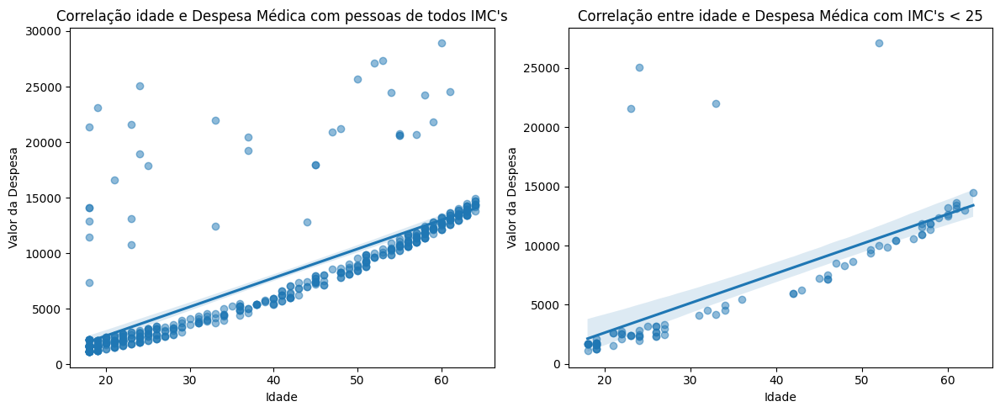

In [47]:
# --- Criar a figura e os subplots ---
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(12, 5))  # 1 linha, 2 colunas, ajuste o figsize

# --- Primeiro Gráfico (IMC < 26) ---
sns.regplot(x='age', y='charges', data=filtered_df_to_age, scatter_kws={'alpha': 0.5}, ax=axes[0])
axes[0].set_title("Correlação idade e Despesa Médica com pessoas de todos IMC's")
axes[0].set_xlabel('Idade')
axes[0].set_ylabel('Valor da Despesa')


# --- Segundo Gráfico (IMC > 31) ---
sns.regplot(x='age', y='charges', data=filtered_df_to_age_with_bmi, scatter_kws={'alpha': 0.5}, ax=axes[1])
axes[1].set_title("Correlação entre idade e Despesa Médica com IMC's < 25")
axes[1].set_xlabel('Idade')
axes[1].set_ylabel('Valor da Despesa')

# --- Ajustar o layout para evitar sobreposição ---
plt.tight_layout()

# --- Exibir a figura ---
plt.show()

### Excluindo pessoas com filhos, que fumam e comparando os gráficos, observa-se que ao excluir as pessoas com IMC maior que 25, a ocorrência de despesas acima de 10.000 dólares diminuiem drasticamente

In [209]:
mean_charges_every_bmi = filtered_df_to_age['charges'].mean()
mean_charges_specif_bmi = filtered_df_to_age_with_bmi['charges'].mean()

print(f"Media de despesas com todos IMC: {mean_charges_every_bmi}")
print(f"Media de despesas com IMC < 25: {mean_charges_specif_bmi}")


Media de despesas com todos IMC: 7474.564330303463
Media de despesas com IMC < 25: 6490.443208372093


### Ao considerar todos os IMC's do grupo que excluem as influências de filhos e fumar ou não, a média de gastos é cerca de 15,5% maior do que se esse grupo considerasse apenas IMC's menores que 25

In [49]:
filtered_df = df[(df['children'] == 0) & (df['smoker'] == 'no') & (df['bmi'] < 30)]
filtered_df_with_smoker = df[(df['children'] == 0) & (df['smoker'] == 'yes') & (df['bmi'] < 30)]


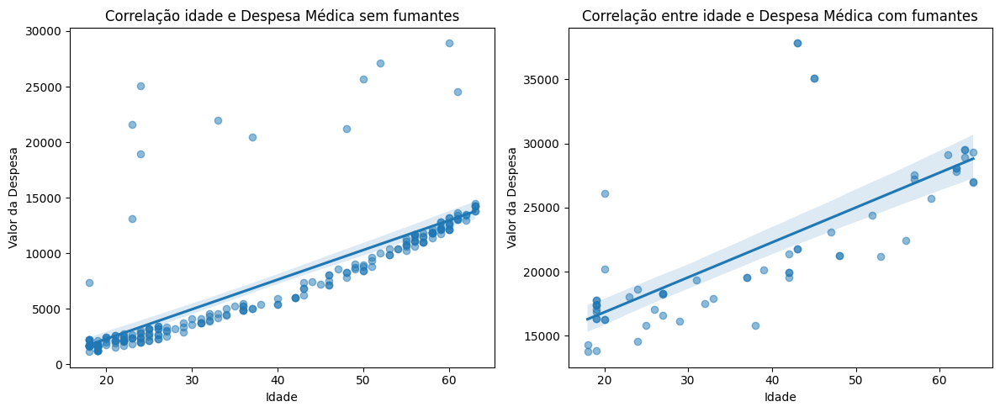

In [50]:
# --- Criar a figura e os subplots ---
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(12, 5))  # 1 linha, 2 colunas, ajuste o figsize

# --- Primeiro Gráfico (IMC < 26) ---
sns.regplot(x='age', y='charges', data=filtered_df, scatter_kws={'alpha': 0.5}, ax=axes[0])
axes[0].set_title("Correlação idade e Despesa Médica sem fumantes")
axes[0].set_xlabel('Idade')
axes[0].set_ylabel('Valor da Despesa')


# --- Segundo Gráfico (IMC > 31) ---
sns.regplot(x='age', y='charges', data=filtered_df_with_smoker, scatter_kws={'alpha': 0.5}, ax=axes[1])
axes[1].set_title("Correlação entre idade e Despesa Médica com fumantes")
axes[1].set_xlabel('Idade')
axes[1].set_ylabel('Valor da Despesa')

# --- Ajustar o layout para evitar sobreposição ---
plt.tight_layout()

# --- Exibir a figura ---
plt.show()

### Agora, quando consideramos pessoas sem filhos e com IMC menor que 30 e que não fumam, as despesas se comportam quase linearmente em relação a idade.
### No entanto, enquanto essas pessoas, dos 20 aos 60 anos, gastam na faixa de 2.000 a 15.000 dólares, os que fumam, também sem filhos e com o mesmo IMC, gastam na faixa dos 15 a 30 mil dólares

In [245]:
mean_charges_smokers = filtered_df_with_smoker['charges'].mean()
mean_charges_without_smokers = filtered_df['charges'].mean()
print(f"Média de despesas fumantes: {mean_charges_smokers}. Total de segurados {filtered_df_to_age_with_smoker.shape[0]}")
print(f"Média de despesas não fumantes: {mean_charges_without_smokers}. Total de segurados {filtered_df_to_age.shape[0]}")


Média de despesas fumantes: 21691.540509516133. Total de segurados 62
Média de despesas não fumantes: 6916.103875908695. Total de segurados 230


### A média de gastor pelos fumantes é bem superior

In [214]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3630 entries, 0 to 3629
Data columns (total 7 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   age       3630 non-null   float64
 1   sex       3630 non-null   object 
 2   bmi       3630 non-null   float64
 3   smoker    3630 non-null   object 
 4   region    3630 non-null   object 
 5   children  3630 non-null   int64  
 6   charges   3630 non-null   float64
dtypes: float64(3), int64(1), object(3)
memory usage: 198.6+ KB


In [67]:
filtered_df_smokers = df[(df['smoker'] == 'yes') & (df['bmi'] < 30)]
filtered_df_no_smokers = df[(df['smoker'] == 'no') & (df['bmi'] < 30)]

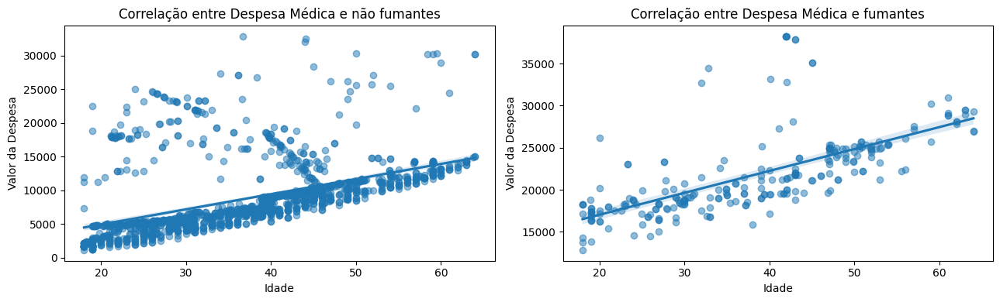

In [93]:
# --- Criar a figura e os subplots ---
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(13, 4))  # 1 linha, 2 colunas, ajuste o figsize

# --- Primeiro Gráfico (IMC < 26) ---
sns.regplot(x='age', y='charges', data=filtered_df_no_smokers, scatter_kws={'alpha': 0.5}, ax=axes[0])
axes[0].set_title("Correlação entre Despesa Médica e não fumantes")
axes[0].set_xlabel('Idade')
axes[0].set_ylabel('Valor da Despesa')


# --- Segundo Gráfico (IMC > 31) ---
sns.regplot(x='age', y='charges', data=filtered_df_smokers, scatter_kws={'alpha': 0.5}, ax=axes[1])
axes[1].set_title("Correlação entre Despesa Médica e fumantes")
axes[1].set_xlabel('Idade')
axes[1].set_ylabel('Valor da Despesa')

# --- Ajustar o layout para evitar sobreposição ---
plt.tight_layout()

# --- Exibir a figura ---
plt.show()

### Agora considerando pessoas não fumantes com filhos e com IMC menor que 30, o gráfico apresenta mais ocorrências de gastos acima de 20.000 dólares, devido aos filhos.

In [8]:
filtered_df_smokers_f = df[(df['smoker'] == 'yes') & (df['sex'] == 'female') & (df['bmi'] < 30)]
filtered_df_smokers_m = df[(df['smoker'] == 'yes') & (df['sex'] == 'male') & (df['bmi'] < 30)]

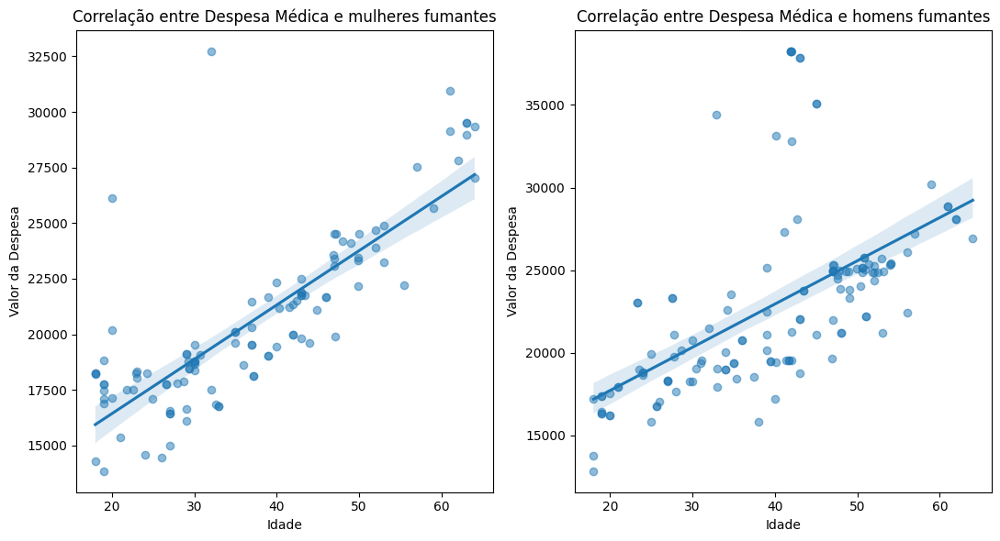

In [100]:
# --- Criar a figura e os subplots ---
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(11, 6))  # 1 linha, 2 colunas, ajuste o figsize

# --- Primeiro Gráfico (IMC < 26) ---
sns.regplot(x='age', y='charges', data=filtered_df_smokers_f, scatter_kws={'alpha': 0.5}, ax=axes[0])
axes[0].set_title("Correlação entre Despesa Médica e mulheres fumantes")
axes[0].set_xlabel('Idade')
axes[0].set_ylabel('Valor da Despesa')


# --- Segundo Gráfico (IMC > 31) ---
sns.regplot(x='age', y='charges', data=filtered_df_smokers_m, scatter_kws={'alpha': 0.5}, ax=axes[1])
axes[1].set_title("Correlação entre Despesa Médica e homens fumantes")
axes[1].set_xlabel('Idade')
axes[1].set_ylabel('Valor da Despesa')

# --- Ajustar o layout para evitar sobreposição ---
plt.tight_layout()

# --- Exibir a figura ---
plt.show()

### Considerando homens e mulheres fumantes apenas com IMC menor que 30, observa-se que o sexo não é relevante para o comportamento das despesas

In [219]:
mean_charges_smokers_f = filtered_df_smokers_f['charges'].mean()
mean_charges_smokers_m = filtered_df_smokers_m['charges'].mean()
print(f"Média de despesas mulheres fumantes: {mean_charges_smokers_f}")
print(f"Média de despesas homens fumantes: {mean_charges_smokers_m}")

Média de despesas mulheres fumantes: 20534.136367820596
Média de despesas homens fumantes: 22820.50754218801


# Inferência

### Verificando se existe multicolinearidade entre as variáveis de IMC com idade e N° de filhos

In [11]:
df_temp = df[(df['smoker'] == 'no')]
df_temp.head()

,age,sex,bmi,smoker,region,children,charges
0,21.0,male,25.745000,no,northeast,2,3279.868550
2,18.0,male,30.030000,no,southeast,1,1720.353700
3,37.0,male,30.676891,no,northeast,3,6801.437542
4,58.0,male,32.010000,no,southeast,1,11946.625900
5,46.0,male,26.620000,no,southeast,1,7742.109800


In [12]:

results = smf.ols('bmi ~ age + children', data=df_temp).fit()

print(results.summary())

                            OLS Regression Results                            
Dep. Variable:                    bmi   R-squared:                       0.026
Model:                            OLS   Adj. R-squared:                  0.025
Method:                 Least Squares   F-statistic:                     40.58
Date:                Wed, 12 Feb 2025   Prob (F-statistic):           4.02e-18
Time:                        17:56:40   Log-Likelihood:                -9442.1
No. Observations:                3070   AIC:                         1.889e+04
Df Residuals:                    3067   BIC:                         1.891e+04
Df Model:                           2                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept     28.1184      0.359     78.274      0.0

### Aplicando uma regressão OLS, vemos que a variância do IMC é 'pouco explicada' pela idade e N° de filhos.

A regressão linear é dada como:

$$
Y = \beta_0 + \beta_1 X_1 + \beta_2 X_2 + \ldots + \beta_p X_p + \epsilon
$$

A partir da regressão de OLS, $B_0, B_1 e B_2$ são, respectivamente, 28.4311, 0.0634 e -0.1060. Em outras palavras, nossa equação ficou:

$bmi = 28.1184 + 0.0634 * age - 0.1060 * children$

### Ou seja:

##### Para cada um ano, o bmi (IMC) eleva 0,0634 (aprox 64 gramas).

##### Para cada filho, o bmi (IMC) reduz -0.1060 (aprox 106 gramas).

#### Com o R² em mãos, podemos calcular o VIF. 
#### O VIF de uma variável mede o quanto a variância do coeficiente de regressão dessa variável é inflacionada devido à correlação com outras variáveis do modelo. 
#### Valores VIF maiores que 1 indicam multicolinearidade. Uma regra prática comum é que se o VIF for maior que 5 (ou às vezes 10), então a multicolinearidade é alta, e considera-se remover algumas variáveis do modelo ou usar técnicas como a regularização para mitigar a multicolinearidade.

In [2]:
vif = 1/(1-0.026)

print(f'VIF: {vif}')





VIF: 1.026694045174538


### Com esse VIF, Não há colinearidade entre o IMC  e as demais variáveis.

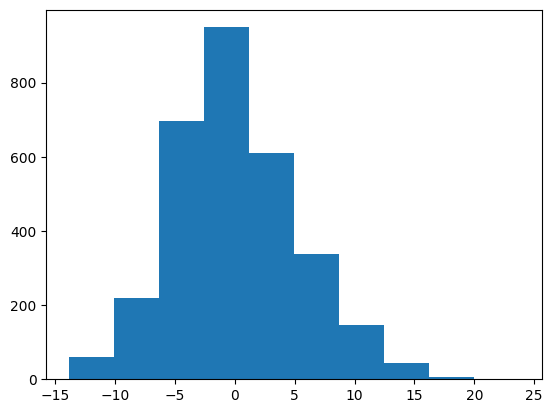

In [13]:
residuals = results.resid

_ = plt.hist(residuals)
_ = plt.show()

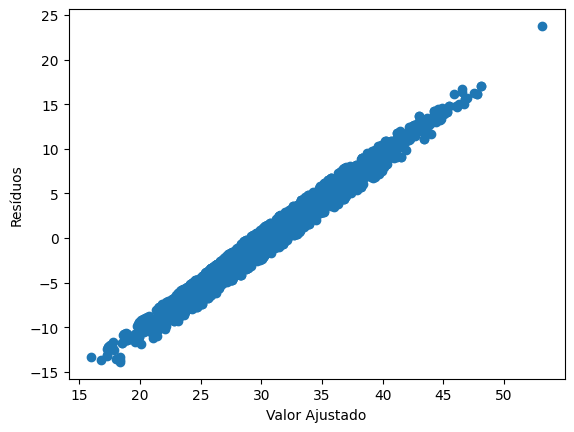

In [14]:
# Obtém o valor ajustado
fitted_values = results.fittedvalues

# Gráfico dos resíduos em relação ao valor ajustado (Checando homoscedasticidade)
plt.scatter(df_temp.bmi, results.resid)
plt.xlabel('Valor Ajustado')
plt.ylabel('Resíduos')
plt.show()

### Para a equação de regressão encontrada, vemos que o valor dos resíduos (erros) aumenta conforme a progressão de uma das variáveis (idade), configurando heterocedasticidade.

# Modelagem

In [15]:
X = df.drop(columns= ['charges'], axis = 1 )
y = df.charges

In [16]:
X.head()

,age,sex,bmi,smoker,region,children
0,21.000000,male,25.745000,no,northeast,2
1,36.976978,female,25.744165,yes,southeast,3
2,18.000000,male,30.030000,no,southeast,1
3,37.000000,male,30.676891,no,northeast,3
4,58.000000,male,32.010000,no,southeast,1


### Criando os conjustos de treino e teste

In [17]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = .3, random_state=22)

#### Instanciando os modelos escolhidos:

In [18]:
model_catboost = CatBoostRegressor(n_estimators = 1000, max_depth = 8, learning_rate = 1e-3, random_state = 0, verbose = 0)


In [19]:
model_linear_regression = LinearRegression()

In [20]:
model_random_forest = RandomForestRegressor(n_estimators = 1000, max_depth = 8, random_state=0, verbose = 0)

In [21]:
model_XGBoost = XGBRegressor(n_estimators = 1000, max_depth = 8, learning_rate = 1e-3, n_jobs = -1, random_state = 0)

In [22]:
X_train.info()

<class 'pandas.core.frame.DataFrame'>
Index: 2541 entries, 3094 to 2933
Data columns (total 6 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   age       2541 non-null   float64
 1   sex       2541 non-null   object 
 2   bmi       2541 non-null   float64
 3   smoker    2541 non-null   object 
 4   region    2541 non-null   object 
 5   children  2541 non-null   int64  
dtypes: float64(2), int64(1), object(3)
memory usage: 139.0+ KB


# Feature importance

#### Primeiramente, vamos converter as features categóricas usando o método get_dummies do pandas

In [23]:
df_encoded = pd.get_dummies(df, drop_first=True)

In [24]:
df_encoded.head()

,age,bmi,children,charges,sex_male,smoker_yes,region_northwest,region_southeast,region_southwest
0,21.000000,25.745000,2,3279.868550,True,False,False,False,False
1,36.976978,25.744165,3,21454.494239,False,True,False,True,False
2,18.000000,30.030000,1,1720.353700,True,False,False,True,False
3,37.000000,30.676891,3,6801.437542,True,False,False,False,False
4,58.000000,32.010000,1,11946.625900,True,False,False,True,False


#### Agora, podemos verificar coma as features, que antes eram categóricas, se comportam na matriz de correlação:

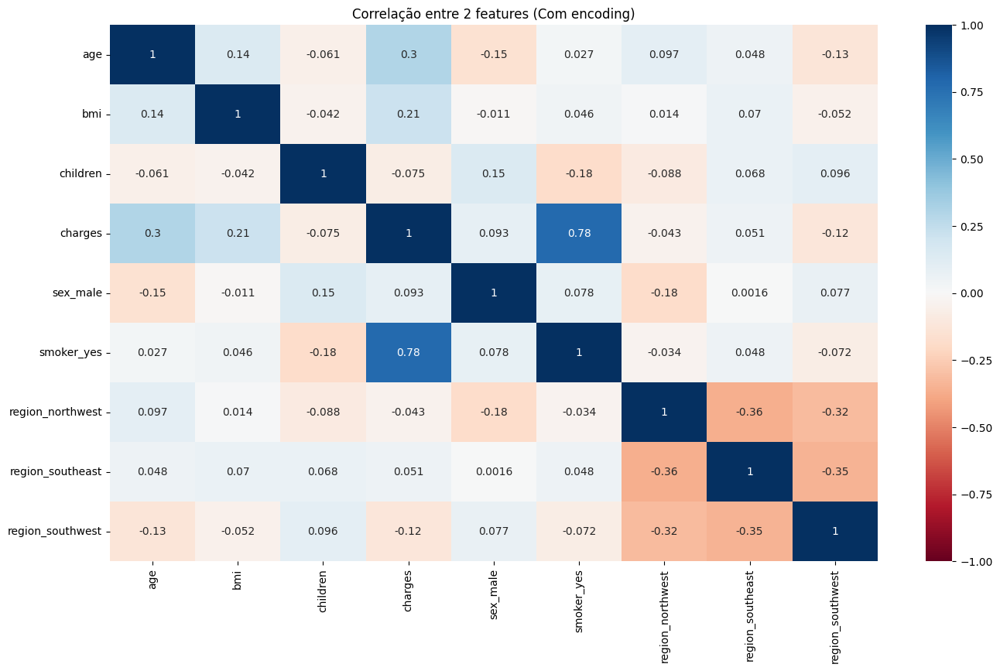

In [25]:
plt.figure(figsize=(16,9))
plt.title('Correlação entre 2 features (Com encoding)')
sns.heatmap(df_encoded.corr(), annot = True, vmin=-1, vmax=1, cmap='RdBu')
plt.show()

#### Vemos que a condição de fumante está fortemente correlacionada com os gastos médicos
#### Vamos criar um conjunto de treino e teste, aplicar o encoding em cada um e em seguida verificar a importncia de cada feature em um ranking

In [26]:
X_train_encoded = X_train.copy()
X_test_encoded = X_test.copy()

# Aplicar One-Hot Encoding nos dois conjuntos juntos para manter as mesmas colunas
X_train_encoded = pd.get_dummies(X_train_encoded, drop_first=True)
X_test_encoded = pd.get_dummies(X_test_encoded, drop_first=True)


#### O permutation importance é responsável por embaralhar os valores de cada feature de acordo com o parametro n_repeats
#### Embaralhá-los permite identificar o quão responsável essa feature é para a melhora ou piora do modelo

In [27]:
model_linear_regression.fit(X_train_encoded, y_train)

# obtendo as importancias para cada coluna do dataframe
r = permutation_importance(model_linear_regression, X_test_encoded, y_test, n_repeats=30, random_state = 0)


In [28]:
# Criando um dataframe para melhor apresentar as importâncias

importances = pd.DataFrame({'feature': X_test_encoded.columns, 'importance':r.importances_mean})

importances = importances.sort_values(by='importance', ascending=False)

importances

,feature,importance
4,smoker_yes,1.184275
0,age,0.150136
1,bmi,0.046766
5,region_northwest,0.017284
2,children,0.017156
7,region_southwest,0.015451
6,region_southeast,0.009105
3,sex_male,0.006953


#### Temos que o comportamento de fumar, a progressão da idade e o IMC são relevantes para o desempenho do modelo
- Se a pontuação de uma feature for alta, significa que embaralhar seus valores afetou bastante o desempenho do modelo,
  indicando que essa variável é muito relevante para as previsões.
- Se a pontuação for baixa ou próxima de zero, significa que embaralhar essa variável teve pouco impacto no modelo, sugerindo que
  ela pode ser irrelevante ou redundante.

## Feature Engineering - Buscando novas features

#### Criando uma feature polinomial para idade, buscando captar melhor a relação entre idade e despesa médica

In [29]:
# --- APLICANDO POLYNOMIALFEATURES DIRETAMENTE EM X ---
poly = PolynomialFeatures(degree=2, include_bias=False) # degree=2, sem bias
X_poly_train = poly.fit_transform(X_train_encoded[['age']])  # Aplica APENAS à coluna 'age'
X_poly_test = poly.fit_transform(X_test_encoded[['age']])  # Aplica APENAS à coluna 'age'


# Criar um novo DataFrame com as colunas polinomiais:
X_poly_train_df = pd.DataFrame(X_poly_train, columns=poly.get_feature_names_out(['age']))
X_poly_test_df = pd.DataFrame(X_poly_test, columns=poly.get_feature_names_out(['age']))


# --- RESETAR OS ÍNDICES ANTES DE CONCATENAR! ---
X_train_encoded = X_train_encoded.drop(columns=['age']).reset_index(drop=True)  # Remove 'age' E reseta o índice
X_test_encoded = X_test_encoded.drop(columns=['age']).reset_index(drop=True)  # Remove 'age' E reseta o índice

X_poly_train_df = X_poly_train_df.reset_index(drop=True)  # Reseta o índice de X_poly_df
X_poly_test_df = X_poly_test_df.reset_index(drop=True)  # Reseta o índice de X_poly_df


# --- AGORA, CONCATENAR ---
X_train_encoded = pd.concat([X_train_encoded, X_poly_train_df], axis=1) #Junta os dois.
X_test_encoded = pd.concat([X_test_encoded, X_poly_test_df], axis=1) #Junta os dois.



X_train_encoded.head()

,bmi,children,sex_male,smoker_yes,region_northwest,region_southeast,region_southwest,age,age^2
0,32.965000,0,False,False,True,False,False,41.000000,1681.000000
1,36.813497,5,True,False,False,False,True,20.000000,400.000000
2,35.844648,4,True,False,False,False,False,33.999478,1155.964477
3,29.423250,5,False,False,False,True,False,40.924870,1674.844976
4,27.839996,3,True,True,False,True,False,46.901286,2199.730630


#### Feature polinomial criada

### Vamos realizar o feature importance novamente para verificar se fizemos um ajuste relevante

In [30]:
model_linear_regression.fit(X_train_encoded, y_train)

# obtendo as importancias para cada coluna do dataframe
r = permutation_importance(model_linear_regression, X_test_encoded, y_test, n_repeats=30, random_state = 0)

In [31]:
# Criando um dataframe para melhor apresentar as importâncias

importances = pd.DataFrame({'feature': X_test_encoded.columns, 'importance':r.importances_mean})

importances = importances.sort_values(by='importance', ascending=False)

importances

,feature,importance
3,smoker_yes,1.185621
8,age^2,0.230876
0,bmi,0.044901
1,children,0.023863
6,region_southwest,0.018261
4,region_northwest,0.018001
5,region_southeast,0.009625
2,sex_male,0.006591
7,age,0.003394


#### Criar uma feature polinomial foi efetivo
#### Vamos explorar essa relevância em uma validação cruzada

In [36]:
categorical_features=['smoker', 'sex', 'region']

# Validação Cruzada

In [32]:
def cross_validate(model, X, y, categorical_features, value_degree, n_splits=5):
    kf = KFold(n_splits=n_splits, shuffle=True, random_state=22)
    scores_mae = []
    scores_r2 = []
    
    if value_degree == 0:
        print(X.head())
        
    else:
         # --- APLICANDO POLYNOMIALFEATURES DIRETAMENTE EM X ---
        poly = PolynomialFeatures(degree=value_degree, include_bias=False) # degree=2, sem bias
        X_poly = poly.fit_transform(X[['age']])  # Aplica APENAS à coluna 'age'
        
        # Criar um novo DataFrame com as colunas polinomiais:
        X_poly_df = pd.DataFrame(X_poly, columns=poly.get_feature_names_out(['age']))
        
        # Juntar com as outras colunas de X (USANDO pd.concat - IMPORTANTE!):
        X = pd.concat([X.drop(columns=['age']), X_poly_df], axis=1)
    
        print(X.head())

    for train_index, test_index in kf.split(X):
        print(f"-------- Fold ---------")
        X_train, X_test = X.iloc[train_index], X.iloc[test_index]
        y_train, y_test = y.iloc[train_index], y.iloc[test_index]

        # --- ENCODING DENTRO DO LOOP ---
        encoder = OneHotEncoder(handle_unknown='ignore', sparse_output=False) #sparse=False para compatibilidade

        # Ajuste o encoder APENAS nos dados de TREINAMENTO do fold
        X_train_encoded = encoder.fit_transform(X_train[categorical_features])
        # Transforme os dados de VALIDAÇÃO usando o encoder JÁ AJUSTADO
        X_test_encoded = encoder.transform(X_test[categorical_features])


        # Agrupa os dados codificados com as outras features
        X_train_final = np.hstack([X_train.drop(columns=categorical_features).values, X_train_encoded])
        X_test_final = np.hstack([X_test.drop(columns=categorical_features).values, X_test_encoded])
        
        # Treinando o modelo
        model.fit(X_train_final, y_train)

        # Fazendo previsões
        y_pred = model.predict(X_test_final)

        # Calculando métricas de avaliação de avaliação (ex: MSE)
        r2s= r2_score(y_test, y_pred)
        mse = mean_squared_error(y_test, y_pred)
        mae = mean_absolute_error(y_test, y_pred)
        mape = mean_absolute_percentage_error(y_test, y_pred)
        scores_mae.append(mae)
        scores_r2.append(r2s)
        

    
    print(f"Média MAE: {np.mean(scores_mae):.3f} -- Média R2: {np.mean(scores_r2):.3f}")  


### Testando validação cruzada com a implementação no novos graus polinomiais

### Age¹

In [148]:
cross_validate(model_linear_regression, X, y, categorical_features, value_degree=0)


   age     sex        bmi  smoker     region  children
0   21    male  25.745000       0  northeast         2
1   36  female  25.744165       1  southeast         3
2   18    male  30.030000       0  southeast         1
3   37    male  30.676891       0  northeast         3
4   58    male  32.010000       0  southeast         1
-------- Fold ---------
-------- Fold ---------
-------- Fold ---------
-------- Fold ---------
-------- Fold ---------
Média MAE: 3847.096 -- Média R2: 0.716


### Age²

In [149]:
cross_validate(model_linear_regression, X, y, categorical_features, value_degree=2)

      sex        bmi  smoker     region  children   age   age^2
0    male  25.745000       0  northeast         2  21.0   441.0
1  female  25.744165       1  southeast         3  36.0  1296.0
2    male  30.030000       0  southeast         1  18.0   324.0
3    male  30.676891       0  northeast         3  37.0  1369.0
4    male  32.010000       0  southeast         1  58.0  3364.0
-------- Fold ---------
-------- Fold ---------
-------- Fold ---------
-------- Fold ---------
-------- Fold ---------
Média MAE: 3825.300 -- Média R2: 0.719


### Age³

In [150]:
cross_validate(model_linear_regression, X, y, categorical_features, value_degree=3)


      sex        bmi  smoker     region  children   age   age^2     age^3
0    male  25.745000       0  northeast         2  21.0   441.0    9261.0
1  female  25.744165       1  southeast         3  36.0  1296.0   46656.0
2    male  30.030000       0  southeast         1  18.0   324.0    5832.0
3    male  30.676891       0  northeast         3  37.0  1369.0   50653.0
4    male  32.010000       0  southeast         1  58.0  3364.0  195112.0
-------- Fold ---------
-------- Fold ---------
-------- Fold ---------
-------- Fold ---------
-------- Fold ---------
Média MAE: 3833.985 -- Média R2: 0.720


### Age elevado à quarta

In [151]:
cross_validate(model_linear_regression, X, y, categorical_features, value_degree=4)


      sex        bmi  smoker     region  children   age   age^2     age^3  \
0    male  25.745000       0  northeast         2  21.0   441.0    9261.0   
1  female  25.744165       1  southeast         3  36.0  1296.0   46656.0   
2    male  30.030000       0  southeast         1  18.0   324.0    5832.0   
3    male  30.676891       0  northeast         3  37.0  1369.0   50653.0   
4    male  32.010000       0  southeast         1  58.0  3364.0  195112.0   

        age^4  
0    194481.0  
1   1679616.0  
2    104976.0  
3   1874161.0  
4  11316496.0  
-------- Fold ---------
-------- Fold ---------
-------- Fold ---------
-------- Fold ---------
-------- Fold ---------
Média MAE: 3837.186 -- Média R2: 0.719


### Ajustando os graus entre 2 e 4, percebe-se que as métricas não apresentam melhores significativas
##### Buscar uma melhor relação entre os gastos e a idade através de uma feature age² faria sentido, por conta da progressão natural da idade, e necessidade de maiores gastos médicos. 
##### Entretanto, essa suposição se mostrou irrelevante ao ser aplicada no modelo

In [33]:
X = df.drop(columns= ['charges'], axis = 1 )
X.head()

,age,sex,bmi,smoker,region,children
0,21.000000,male,25.745000,no,northeast,2
1,36.976978,female,25.744165,yes,southeast,3
2,18.000000,male,30.030000,no,southeast,1
3,37.000000,male,30.676891,no,northeast,3
4,58.000000,male,32.010000,no,southeast,1


# Verificando overffiting do modelo

#### Agora, nossa função de validação cruzada compara as métricas de treinamento e validação:


In [95]:
def cross_validate_train_test(model, X, y, categorical_features, value_degree, n_splits=5):
    kf = KFold(n_splits=n_splits, shuffle=True, random_state=22)

    #Criando listas para cálculos de métricas #
    train_scores_mae = []
    train_scores_r2 = []
    train_scores_mse = []  
    train_scores_mape = [] 
    
    val_scores_mae = []  
    val_scores_r2 = []
    val_scores_mse = []
    val_scores_mape = []

    def calcular_metricas(y_train, y_test, y_pred_train, y_pred_val):
        # --- CÁLCULO DAS MÉTRICAS (TREINO e VALIDAÇÃO) ---
        # TREINO:
        train_mae = mean_absolute_error(y_train, y_pred_train)
        train_r2 = r2_score(y_train, y_pred_train)
        train_mse = mean_squared_error(y_train, y_pred_train)
        train_mape = mean_absolute_percentage_error(y_train, y_pred_train)
    
        train_scores_mae.append(train_mae)
        train_scores_r2.append(train_r2)
        train_scores_mse.append(train_mse)
        train_scores_mape.append(train_mape)
    
        # VALIDAÇÃO:
        val_mae = mean_absolute_error(y_test, y_pred_val)
        val_r2 = r2_score(y_test, y_pred_val)
        val_mse = mean_squared_error(y_test, y_pred_val)
        val_mape = mean_absolute_percentage_error(y_test, y_pred_val)
    
        val_scores_mae.append(val_mae)
        val_scores_r2.append(val_r2)
        val_scores_mse.append(val_mse)
        val_scores_mape.append(val_mape)

    if model == model_linear_regression:       
        print('APLICANDO POLYNOMIALFEATURES DIRETAMENTE EM X\n')
         # --- APLICANDO POLYNOMIALFEATURES DIRETAMENTE EM X ---
        poly = PolynomialFeatures(degree=value_degree, include_bias=False) # degree=2, sem bias
        X_poly = poly.fit_transform(X[['age']])  # Aplica APENAS à coluna 'age'
        
        # Cria um novo DataFrame com as colunas polinomiais:
        X_poly_df = pd.DataFrame(X_poly, columns=poly.get_feature_names_out(['age']))
        
        # Junta com as outras colunas de X (USANDO pd.concat):
        X = pd.concat([X.drop(columns=['age']), X_poly_df], axis=1)
        
    else:
        print('Modelos baseados em ávores de decisão não necessitam de Polinomial Features')
        print('\nTreinando e validando modelo...')
        
    for train_index, test_index in kf.split(X):
        X_train, X_test = X.iloc[train_index], X.iloc[test_index]
        y_train, y_test = y.iloc[train_index], y.iloc[test_index]
      
        if isinstance(model, CatBoostRegressor):
            # --- CATBOOST:  Encoding Nativo ---
            train_pool = Pool(data=X_train, label=y_train, cat_features=categorical_features)
            test_pool = Pool(data=X_test, label=y_test, cat_features=categorical_features)
            
            # Treinando o modelo CatBoost usando os Pools
            model.fit(train_pool, eval_set=test_pool, verbose=False) # verbose=False para menos output
            # verbose=False para evitar muita saída durante o treinamento.  Remova se quiser ver o progresso do CatBoost

            # Avalie
            y_pred_train = model.predict(train_pool) # Previsões nos dados de TREINAMENTO
            y_pred_val = model.predict(test_pool) # Previsões nos dados de VALIDAÇÃO

            calcular_metricas(y_train, y_test, y_pred_train, y_pred_val)
               
        else:
            # --- ENCODING DENTRO DO LOOP ---
            encoder = OneHotEncoder(handle_unknown='ignore', sparse_output=False) #sparse=False para compatibilidade
    
            # Ajustando o encoder APENAS nos dados de TREINAMENTO do fold
            X_train_encoded = encoder.fit_transform(X_train[categorical_features])
            # Transformando os dados de VALIDAÇÃO usando o encoder JÁ AJUSTADO
            X_test_encoded = encoder.transform(X_test[categorical_features])
            
    
            # Juntando os dados codificados com as outras features
            X_train_final = np.hstack([X_train.drop(columns=categorical_features).values, X_train_encoded])
            X_test_final = np.hstack([X_test.drop(columns=categorical_features).values, X_test_encoded])
            
            # Treinando o modelo
            model.fit(X_train_final, y_train)
            
            # --- PREVISÕES (no TREINO *E* na VALIDAÇÃO) ---
            y_pred_train = model.predict(X_train_final)  # Previsões nos dados de TREINAMENTO
            y_pred_val = model.predict(X_test_final)   # Previsões nos dados de VALIDAÇÃO

            # Chamando a função que calcula as métricas 
            calcular_metricas(y_train, y_test, y_pred_train, y_pred_val)
        
        
    # --- APRESENTAÇÃO DOS RESULTADOS (MÉDIAS E DESVIOS PADRÃO) ---
    print("\n--- MÉTRICAS NO TREINAMENTO (Média +/- Desvio Padrão) ---")
    print(f"MAE (Treino):  {np.mean(train_scores_mae):.4f} +/- {np.std(train_scores_mae):.4f}")
    print(f"R²  (Treino):  {np.mean(train_scores_r2):.4f} +/- {np.std(train_scores_r2):.4f}")
    print(f"MSE (Treino):  {np.mean(train_scores_mse):.4f} +/- {np.std(train_scores_mse):.4f}")
    print(f"MAPE (Treino): {np.mean(train_scores_mape):.4f} +/- {np.std(train_scores_mape):.4f}")
    
    
    print("\n--- MÉTRICAS NA VALIDAÇÃO (Média +/- Desvio Padrão) ---")
    print(f"MAE (Validação): {np.mean(val_scores_mae):.4f} +/- {np.std(val_scores_mae):.4f}")
    print(f"R²  (Validação): {np.mean(val_scores_r2):.4f} +/- {np.std(val_scores_r2):.4f}")
    print(f"MSE (Validação): {np.mean(val_scores_mse):.4f} +/- {np.std(val_scores_mse):.4f}")
    print(f"MAPE (Validação):{np.mean(val_scores_mape):.4f} +/- {np.std(val_scores_mape):.4f}")
             

### Verificando métricas para o modelo de regressão linear ( com features polinomiais de grau 2):

In [96]:
cross_validate_train_test(model_linear_regression, X, y, categorical_features, value_degree=2)

APLICANDO POLYNOMIALFEATURES DIRETAMENTE EM X


--- MÉTRICAS NO TREINAMENTO (Média +/- Desvio Padrão) ---
MAE (Treino):  3810.2241 +/- 27.8365
R²  (Treino):  0.7213 +/- 0.0036
MSE (Treino):  32167893.6480 +/- 253821.1729
MAPE (Treino): 0.3490 +/- 0.0035

--- MÉTRICAS NA VALIDAÇÃO (Média +/- Desvio Padrão) ---
MAE (Validação): 3823.7502 +/- 85.4932
R²  (Validação): 0.7186 +/- 0.0156
MSE (Validação): 32352973.4445 +/- 1035253.3827
MAPE (Validação):0.3502 +/- 0.0177


#### O modelo de regressão linear está generalizando bem os dados de treinamento para os dados de validação (não vistos). 
#### As métricas são consistentemente similares entre treino e validação.
#### Entretanto, devido ao tipo de aplicação  do modelo em um caso do mundo real, os resíduos entre os valores previstos e reais são 
#### considerados altos. Errar em média 3820 dólares (conforme a métrica MAE), ao prever gastos que neste dataset 
#### tem uma média de 12.700 mil dólares, prejudicaria a previsibilidade dos gastos médicos e consequentemente o controle financeiro.

## Testando novos modelos

#### Modelos escolhidos: Random Forest, XGBoost e CatBoost

### Justificativa da escolha:
- Conforme a análise exploratória das dados, existem outliers dispersos em função principlamente da condição de fumante e alto IMC. Um modelo de regressão linear não conseguiria compreender o padrão de comportamento desses outliers
- A função de custo usada para a convergência do modelo é muito sensível aos altos valores aleatórios com relação aos fumantes e alto IMC.
  Essa função  faz com que resíduos grandes tenham um impacto muito maior do que residuos pequenos, o que dificulta convergir o modelo.
### Já os outros modelos, como são árvores de decisão baseadas em ensemble, temos:
- Resistência a outliers – Ao contrário da regressão linear, que é altamente sensível a valores extremos, árvores de decisão particionam os dados e são menos afetadas por pontos muito distantes.
- Não assume relação linear – Se o relacionamento entre as variáveis for não-linear, a regressão linear não conseguirá capturar bem os padrões. Modelos baseados em árvores aprendem relações não-lineares naturalmente.
- Capacidade de captura de interações – Árvores de decisão lidam melhor com interações complexas entre variáveis, o que pode ser importante para capturar padrões ocultos nos dados.

### Além disso, modelos em esemble são poderosos por combinar o desempenho de vários modelos.
##### Modelos em esemble Boosting (XGBoost e CatBoost):
- Treina modelos de forma sequencial, onde cada novo modelo aprende com os erros do anterior.
- O objetivo é dar mais peso aos erros cometidos pelo modelo anterior e ajustar os parãmetros de aprendizagem.
##### Modelos com esemble Bagging (Random Forest):
- Treina múltiplos modelos em subconjuntos diferentes dos dados, e no caso de regressão, a predição final é a média dos valores preditos por todas as árvores de decisão em esemble.
- A RandomForest está bem amparada na Lei Fraca dos Grands números, uma lei estatística que afirma que, à medida que o tamanho da
  amostra cresce, a média amostral se aproxima da média verdadeira da população. A relação com essa lei está no fato de que, ao treinar vários modelos em
  diferentes amostras, a média das previsões individuais tende a se aproximar do valor real esperado, reduzindo a variância e melhorando a generalização do modelo.

### Random Forest

In [156]:
cross_validate_train_test(model_random_forest, X, y, categorical_features, value_degree=0)

Modelos baseados em ávores de decisão não necessitam de Polinomial Features

Treinando e validando modelo...

--- MÉTRICAS NO TREINAMENTO (Média +/- Desvio Padrão) ---
MAE (Treino):  1217.7394 +/- 17.9317
R²  (Treino):  0.9434 +/- 0.0020
MSE (Treino):  6527577.1763 +/- 183019.9211
MAPE (Treino): 0.1211 +/- 0.0018

--- MÉTRICAS NA VALIDAÇÃO (Média +/- Desvio Padrão) ---
MAE (Validação): 1655.7239 +/- 71.2778
R²  (Validação): 0.8930 +/- 0.0110
MSE (Validação): 12280838.9032 +/- 828732.0542
MAPE (Validação):0.1616 +/- 0.0108


### XGBoost

In [38]:
cross_validate_train_test(model_XGBoost, X, y, categorical_features, value_degree=0)


Modelos baseados em ávores de decisão não necessitam de Polinomial Features

Treinando e validando modelo...

--- MÉTRICAS NO TREINAMENTO (Média +/- Desvio Padrão) ---
MAE (Treino):  3456.9777 +/- 47.3471
R²  (Treino):  0.7965 +/- 0.0022
MSE (Treino):  23496836.9616 +/- 456739.0041
MAPE (Treino): 0.4472 +/- 0.0046

--- MÉTRICAS NA VALIDAÇÃO (Média +/- Desvio Padrão) ---
MAE (Validação): 3696.8637 +/- 85.6094
R²  (Validação): 0.7597 +/- 0.0135
MSE (Validação): 27680240.9497 +/- 2021633.0968
MAPE (Validação):0.4736 +/- 0.0346


### CatBoost

In [164]:
cross_validate_train_test(model_catboost, X, y, categorical_features, value_degree=0)


Modelos baseados em ávores de decisão não necessitam de Polinomial Features

Treinando e validando modelo...

--- MÉTRICAS NO TREINAMENTO (Média +/- Desvio Padrão) ---
MAE (Treino):  4482.0340 +/- 78.6164
R²  (Treino):  0.6791 +/- 0.0054
MSE (Treino):  37039552.1818 +/- 675064.7620
MAPE (Treino): 0.5958 +/- 0.0127

--- MÉTRICAS NA VALIDAÇÃO (Média +/- Desvio Padrão) ---
MAE (Validação): 4510.8616 +/- 83.5575
R²  (Validação): 0.6727 +/- 0.0162
MSE (Validação): 37627598.6414 +/- 1046140.0010
MAPE (Validação):0.5988 +/- 0.0620



### O modelo baseado em RandomForest se mostrou muito superior, conseguindo identificar relações não lineares, 
### além de reduzir bem as métricas de erro, fundamental para uma previsão financeira mais segura.




## Tunagem de hiperparâmetros

### Criando função de tunagem de hiperparâmetros
##### Uma vez executada, a cada loop de interação:
##### - Realiza o encode das features categóricas de cada fold
##### - Treina o modelo com o fold tratado, e em seguida, faz as predições para o fold de teste
##### - Por fim, retorna as métricas

In [39]:
def hyperparams_tunning(trial, n_splits=5):
    n_estimators = trial.suggest_int('n_estimators', 100, 1000, step=50)
    max_depth = trial.suggest_int('max_depth', 5, 15)
    min_samples_split = trial.suggest_int('min_samples_split', 2, 15)
    min_samples_leaf = trial.suggest_int('min_samples_leaf', 2, 8)
    
    erros_mse = list()
    
    Kf = KFold(n_splits=5, shuffle=True, random_state=22)

    for n_splits, (train_index, test_index) in enumerate(Kf.split(X)):
          
        val_scores_mse = list()
    
        print("=-"*6 + f"fold: {n_splits+1}" + "-="*6)
        X_train, X_test = X.iloc[train_index], X.iloc[test_index]
        y_train, y_test = y.iloc[train_index], y.iloc[test_index]
        
        # --- ENCODING DENTRO DO LOOP ---
        encoder = OneHotEncoder(handle_unknown='ignore', sparse_output=False) #sparse=False para compatibilidade
    
        # Ajuste o encoder APENAS nos dados de TREINAMENTO do fold
        X_train_encoded = encoder.fit_transform(X_train[categorical_features])
        # Transforme os dados de VALIDAÇÃO usando o encoder JÁ AJUSTADO
        X_test_encoded = encoder.transform(X_test[categorical_features])
    
    
        # Juntando os dados codificados com as outras features
        X_train_final = np.hstack([X_train.drop(columns=categorical_features).values, X_train_encoded])
        X_test_final = np.hstack([X_test.drop(columns=categorical_features).values, X_test_encoded])


        # **Criando um novo modelo a cada iteração**
        model_random_forest = RandomForestRegressor(
            n_estimators=n_estimators,
            max_depth=max_depth,
            min_samples_split=min_samples_split,
            min_samples_leaf=min_samples_leaf,
            random_state=22
        )
        
        # Treinando o modelo
        model_random_forest.fit(X_train_final, y_train)
        
        # --- PREVISÕES ---
        y_pred_val = model_random_forest.predict(X_test_final)      # Previsões nos dados de VALIDAÇÃO

         # --- CÁLCULO DAS MÉTRICAS ---
        # TREINO:
        val_mse = mean_squared_error(y_test, y_pred_val)
        val_scores_mse.append(val_mse)

        erros_mse.append(val_mse)
        
    erros_mse = np.array(erros_mse)
    mean_mse = np.mean(erros_mse)
    
    return float(mean_mse)
    

#### Por que usar a métrica MSE da validação para otimização?
##### Evita overfitting => Otimizar o MSE do treino pode acabar criando um modelo que se ajusta demais aos dados de treinamento e não generaliza bem para novos dados.
##### Mede a capacidade do modelo de generalizar => Como a validação usa dados que o modelo não viu, ela simula melhor a realidade da previsão em produção.
##### Reflete melhor o desempenho esperado => A métrica da validação é a que realmente importa, pois representa como o modelo se comportaria com novos pacientes e suas despesas médicas.

In [40]:
X = df.drop(columns= ['charges'], axis = 1 )
y = df.charges

X.head()

,age,sex,bmi,smoker,region,children
0,21.000000,male,25.745000,no,northeast,2
1,36.976978,female,25.744165,yes,southeast,3
2,18.000000,male,30.030000,no,southeast,1
3,37.000000,male,30.676891,no,northeast,3
4,58.000000,male,32.010000,no,southeast,1


### Determinando o tipo de otimização da métrica retornada pela função de tunagem (minimize ou maximize):
##### Vamos minimizar o MSE (Erro Quadrado Médio)

In [108]:
study = optuna.create_study(direction = 'minimize')
study.optimize(hyperparams_tunning, n_trials = 60)

[I 2025-02-12 12:59:45,196] A new study created in memory with name: no-name-5c5d94bf-4386-416a-bd12-676718de727e


=-=-=-=-=-=-fold: 1-=-=-=-=-=-=
=-=-=-=-=-=-fold: 2-=-=-=-=-=-=
=-=-=-=-=-=-fold: 3-=-=-=-=-=-=
=-=-=-=-=-=-fold: 4-=-=-=-=-=-=
=-=-=-=-=-=-fold: 5-=-=-=-=-=-=


[I 2025-02-12 12:59:55,036] Trial 0 finished with value: 12858861.466007587 and parameters: {'n_estimators': 300, 'max_depth': 15, 'min_samples_split': 7, 'min_samples_leaf': 6}. Best is trial 0 with value: 12858861.466007587.


=-=-=-=-=-=-fold: 1-=-=-=-=-=-=
=-=-=-=-=-=-fold: 2-=-=-=-=-=-=
=-=-=-=-=-=-fold: 3-=-=-=-=-=-=
=-=-=-=-=-=-fold: 4-=-=-=-=-=-=
=-=-=-=-=-=-fold: 5-=-=-=-=-=-=


[I 2025-02-12 13:00:09,679] Trial 1 finished with value: 13025268.289886523 and parameters: {'n_estimators': 500, 'max_depth': 9, 'min_samples_split': 14, 'min_samples_leaf': 6}. Best is trial 0 with value: 12858861.466007587.


=-=-=-=-=-=-fold: 1-=-=-=-=-=-=
=-=-=-=-=-=-fold: 2-=-=-=-=-=-=
=-=-=-=-=-=-fold: 3-=-=-=-=-=-=
=-=-=-=-=-=-fold: 4-=-=-=-=-=-=
=-=-=-=-=-=-fold: 5-=-=-=-=-=-=


[I 2025-02-12 13:00:25,098] Trial 2 finished with value: 13867419.780570885 and parameters: {'n_estimators': 650, 'max_depth': 6, 'min_samples_split': 11, 'min_samples_leaf': 3}. Best is trial 0 with value: 12858861.466007587.


=-=-=-=-=-=-fold: 1-=-=-=-=-=-=
=-=-=-=-=-=-fold: 2-=-=-=-=-=-=
=-=-=-=-=-=-fold: 3-=-=-=-=-=-=
=-=-=-=-=-=-fold: 4-=-=-=-=-=-=
=-=-=-=-=-=-fold: 5-=-=-=-=-=-=


[I 2025-02-12 13:00:56,629] Trial 3 finished with value: 13049155.05765936 and parameters: {'n_estimators': 1000, 'max_depth': 15, 'min_samples_split': 5, 'min_samples_leaf': 7}. Best is trial 0 with value: 12858861.466007587.


=-=-=-=-=-=-fold: 1-=-=-=-=-=-=
=-=-=-=-=-=-fold: 2-=-=-=-=-=-=
=-=-=-=-=-=-fold: 3-=-=-=-=-=-=
=-=-=-=-=-=-fold: 4-=-=-=-=-=-=
=-=-=-=-=-=-fold: 5-=-=-=-=-=-=


[I 2025-02-12 13:01:30,579] Trial 4 finished with value: 12703696.746831754 and parameters: {'n_estimators': 1000, 'max_depth': 15, 'min_samples_split': 7, 'min_samples_leaf': 5}. Best is trial 4 with value: 12703696.746831754.


=-=-=-=-=-=-fold: 1-=-=-=-=-=-=
=-=-=-=-=-=-fold: 2-=-=-=-=-=-=
=-=-=-=-=-=-fold: 3-=-=-=-=-=-=
=-=-=-=-=-=-fold: 4-=-=-=-=-=-=
=-=-=-=-=-=-fold: 5-=-=-=-=-=-=


[I 2025-02-12 13:01:43,515] Trial 5 finished with value: 14974826.359189177 and parameters: {'n_estimators': 600, 'max_depth': 5, 'min_samples_split': 2, 'min_samples_leaf': 7}. Best is trial 4 with value: 12703696.746831754.


=-=-=-=-=-=-fold: 1-=-=-=-=-=-=
=-=-=-=-=-=-fold: 2-=-=-=-=-=-=
=-=-=-=-=-=-fold: 3-=-=-=-=-=-=
=-=-=-=-=-=-fold: 4-=-=-=-=-=-=
=-=-=-=-=-=-fold: 5-=-=-=-=-=-=


[I 2025-02-12 13:02:04,952] Trial 6 finished with value: 13204704.156229258 and parameters: {'n_estimators': 700, 'max_depth': 13, 'min_samples_split': 7, 'min_samples_leaf': 8}. Best is trial 4 with value: 12703696.746831754.


=-=-=-=-=-=-fold: 1-=-=-=-=-=-=
=-=-=-=-=-=-fold: 2-=-=-=-=-=-=
=-=-=-=-=-=-fold: 3-=-=-=-=-=-=
=-=-=-=-=-=-fold: 4-=-=-=-=-=-=
=-=-=-=-=-=-fold: 5-=-=-=-=-=-=


[I 2025-02-12 13:02:33,249] Trial 7 finished with value: 13047511.277337762 and parameters: {'n_estimators': 900, 'max_depth': 13, 'min_samples_split': 13, 'min_samples_leaf': 7}. Best is trial 4 with value: 12703696.746831754.


=-=-=-=-=-=-fold: 1-=-=-=-=-=-=
=-=-=-=-=-=-fold: 2-=-=-=-=-=-=
=-=-=-=-=-=-fold: 3-=-=-=-=-=-=
=-=-=-=-=-=-fold: 4-=-=-=-=-=-=
=-=-=-=-=-=-fold: 5-=-=-=-=-=-=


[I 2025-02-12 13:02:57,389] Trial 8 finished with value: 12603564.651264068 and parameters: {'n_estimators': 750, 'max_depth': 10, 'min_samples_split': 11, 'min_samples_leaf': 2}. Best is trial 8 with value: 12603564.651264068.


=-=-=-=-=-=-fold: 1-=-=-=-=-=-=
=-=-=-=-=-=-fold: 2-=-=-=-=-=-=
=-=-=-=-=-=-fold: 3-=-=-=-=-=-=
=-=-=-=-=-=-fold: 4-=-=-=-=-=-=
=-=-=-=-=-=-fold: 5-=-=-=-=-=-=


[I 2025-02-12 13:03:02,753] Trial 9 finished with value: 13241684.196584608 and parameters: {'n_estimators': 200, 'max_depth': 7, 'min_samples_split': 11, 'min_samples_leaf': 2}. Best is trial 8 with value: 12603564.651264068.


=-=-=-=-=-=-fold: 1-=-=-=-=-=-=
=-=-=-=-=-=-fold: 2-=-=-=-=-=-=
=-=-=-=-=-=-fold: 3-=-=-=-=-=-=
=-=-=-=-=-=-fold: 4-=-=-=-=-=-=
=-=-=-=-=-=-fold: 5-=-=-=-=-=-=


[I 2025-02-12 13:03:28,185] Trial 10 finished with value: 12660376.701068308 and parameters: {'n_estimators': 800, 'max_depth': 10, 'min_samples_split': 10, 'min_samples_leaf': 4}. Best is trial 8 with value: 12603564.651264068.


=-=-=-=-=-=-fold: 1-=-=-=-=-=-=
=-=-=-=-=-=-fold: 2-=-=-=-=-=-=
=-=-=-=-=-=-fold: 3-=-=-=-=-=-=
=-=-=-=-=-=-fold: 4-=-=-=-=-=-=
=-=-=-=-=-=-fold: 5-=-=-=-=-=-=


[I 2025-02-12 13:03:53,602] Trial 11 finished with value: 12660376.701068308 and parameters: {'n_estimators': 800, 'max_depth': 10, 'min_samples_split': 10, 'min_samples_leaf': 4}. Best is trial 8 with value: 12603564.651264068.


=-=-=-=-=-=-fold: 1-=-=-=-=-=-=
=-=-=-=-=-=-fold: 2-=-=-=-=-=-=
=-=-=-=-=-=-fold: 3-=-=-=-=-=-=
=-=-=-=-=-=-fold: 4-=-=-=-=-=-=
=-=-=-=-=-=-fold: 5-=-=-=-=-=-=


[I 2025-02-12 13:04:07,358] Trial 12 finished with value: 12795884.151196979 and parameters: {'n_estimators': 450, 'max_depth': 9, 'min_samples_split': 12, 'min_samples_leaf': 2}. Best is trial 8 with value: 12603564.651264068.


=-=-=-=-=-=-fold: 1-=-=-=-=-=-=
=-=-=-=-=-=-fold: 2-=-=-=-=-=-=
=-=-=-=-=-=-fold: 3-=-=-=-=-=-=
=-=-=-=-=-=-fold: 4-=-=-=-=-=-=
=-=-=-=-=-=-fold: 5-=-=-=-=-=-=


[I 2025-02-12 13:04:33,096] Trial 13 finished with value: 12942311.213438433 and parameters: {'n_estimators': 800, 'max_depth': 12, 'min_samples_split': 15, 'min_samples_leaf': 4}. Best is trial 8 with value: 12603564.651264068.


=-=-=-=-=-=-fold: 1-=-=-=-=-=-=
=-=-=-=-=-=-fold: 2-=-=-=-=-=-=
=-=-=-=-=-=-fold: 3-=-=-=-=-=-=
=-=-=-=-=-=-fold: 4-=-=-=-=-=-=
=-=-=-=-=-=-fold: 5-=-=-=-=-=-=


[I 2025-02-12 13:05:00,078] Trial 14 finished with value: 12478751.141049048 and parameters: {'n_estimators': 800, 'max_depth': 11, 'min_samples_split': 9, 'min_samples_leaf': 3}. Best is trial 14 with value: 12478751.141049048.


=-=-=-=-=-=-fold: 1-=-=-=-=-=-=
=-=-=-=-=-=-fold: 2-=-=-=-=-=-=
=-=-=-=-=-=-fold: 3-=-=-=-=-=-=
=-=-=-=-=-=-fold: 4-=-=-=-=-=-=
=-=-=-=-=-=-fold: 5-=-=-=-=-=-=


[I 2025-02-12 13:05:24,358] Trial 15 finished with value: 12459685.103593642 and parameters: {'n_estimators': 700, 'max_depth': 12, 'min_samples_split': 9, 'min_samples_leaf': 3}. Best is trial 15 with value: 12459685.103593642.


=-=-=-=-=-=-fold: 1-=-=-=-=-=-=
=-=-=-=-=-=-fold: 2-=-=-=-=-=-=
=-=-=-=-=-=-fold: 3-=-=-=-=-=-=
=-=-=-=-=-=-fold: 4-=-=-=-=-=-=
=-=-=-=-=-=-fold: 5-=-=-=-=-=-=


[I 2025-02-12 13:05:38,899] Trial 16 finished with value: 12277366.737137746 and parameters: {'n_estimators': 400, 'max_depth': 12, 'min_samples_split': 4, 'min_samples_leaf': 3}. Best is trial 16 with value: 12277366.737137746.


=-=-=-=-=-=-fold: 1-=-=-=-=-=-=
=-=-=-=-=-=-fold: 2-=-=-=-=-=-=
=-=-=-=-=-=-fold: 3-=-=-=-=-=-=
=-=-=-=-=-=-fold: 4-=-=-=-=-=-=
=-=-=-=-=-=-fold: 5-=-=-=-=-=-=


[I 2025-02-12 13:05:53,777] Trial 17 finished with value: 12269731.651549418 and parameters: {'n_estimators': 400, 'max_depth': 13, 'min_samples_split': 3, 'min_samples_leaf': 3}. Best is trial 17 with value: 12269731.651549418.


=-=-=-=-=-=-fold: 1-=-=-=-=-=-=
=-=-=-=-=-=-fold: 2-=-=-=-=-=-=
=-=-=-=-=-=-fold: 3-=-=-=-=-=-=
=-=-=-=-=-=-fold: 4-=-=-=-=-=-=
=-=-=-=-=-=-fold: 5-=-=-=-=-=-=


[I 2025-02-12 13:06:05,585] Trial 18 finished with value: 12693494.980937986 and parameters: {'n_estimators': 350, 'max_depth': 13, 'min_samples_split': 2, 'min_samples_leaf': 5}. Best is trial 17 with value: 12269731.651549418.


=-=-=-=-=-=-fold: 1-=-=-=-=-=-=
=-=-=-=-=-=-fold: 2-=-=-=-=-=-=
=-=-=-=-=-=-fold: 3-=-=-=-=-=-=
=-=-=-=-=-=-fold: 4-=-=-=-=-=-=
=-=-=-=-=-=-fold: 5-=-=-=-=-=-=


[I 2025-02-12 13:06:09,452] Trial 19 finished with value: 12355910.639922213 and parameters: {'n_estimators': 100, 'max_depth': 14, 'min_samples_split': 4, 'min_samples_leaf': 3}. Best is trial 17 with value: 12269731.651549418.


=-=-=-=-=-=-fold: 1-=-=-=-=-=-=
=-=-=-=-=-=-fold: 2-=-=-=-=-=-=
=-=-=-=-=-=-fold: 3-=-=-=-=-=-=
=-=-=-=-=-=-fold: 4-=-=-=-=-=-=
=-=-=-=-=-=-fold: 5-=-=-=-=-=-=


[I 2025-02-12 13:06:20,743] Trial 20 finished with value: 12948839.259745533 and parameters: {'n_estimators': 400, 'max_depth': 8, 'min_samples_split': 4, 'min_samples_leaf': 5}. Best is trial 17 with value: 12269731.651549418.


=-=-=-=-=-=-fold: 1-=-=-=-=-=-=
=-=-=-=-=-=-fold: 2-=-=-=-=-=-=
=-=-=-=-=-=-fold: 3-=-=-=-=-=-=
=-=-=-=-=-=-fold: 4-=-=-=-=-=-=
=-=-=-=-=-=-fold: 5-=-=-=-=-=-=


[I 2025-02-12 13:06:24,564] Trial 21 finished with value: 12355910.639922213 and parameters: {'n_estimators': 100, 'max_depth': 14, 'min_samples_split': 4, 'min_samples_leaf': 3}. Best is trial 17 with value: 12269731.651549418.


=-=-=-=-=-=-fold: 1-=-=-=-=-=-=
=-=-=-=-=-=-fold: 2-=-=-=-=-=-=
=-=-=-=-=-=-fold: 3-=-=-=-=-=-=
=-=-=-=-=-=-fold: 4-=-=-=-=-=-=
=-=-=-=-=-=-fold: 5-=-=-=-=-=-=


[I 2025-02-12 13:06:33,255] Trial 22 finished with value: 12534825.045916442 and parameters: {'n_estimators': 250, 'max_depth': 12, 'min_samples_split': 5, 'min_samples_leaf': 4}. Best is trial 17 with value: 12269731.651549418.


=-=-=-=-=-=-fold: 1-=-=-=-=-=-=
=-=-=-=-=-=-fold: 2-=-=-=-=-=-=
=-=-=-=-=-=-fold: 3-=-=-=-=-=-=
=-=-=-=-=-=-fold: 4-=-=-=-=-=-=
=-=-=-=-=-=-fold: 5-=-=-=-=-=-=


[I 2025-02-12 13:06:37,127] Trial 23 finished with value: 12355910.639922213 and parameters: {'n_estimators': 100, 'max_depth': 14, 'min_samples_split': 3, 'min_samples_leaf': 3}. Best is trial 17 with value: 12269731.651549418.


=-=-=-=-=-=-fold: 1-=-=-=-=-=-=
=-=-=-=-=-=-fold: 2-=-=-=-=-=-=
=-=-=-=-=-=-fold: 3-=-=-=-=-=-=
=-=-=-=-=-=-fold: 4-=-=-=-=-=-=
=-=-=-=-=-=-fold: 5-=-=-=-=-=-=


[I 2025-02-12 13:06:45,000] Trial 24 finished with value: 12172785.0183679 and parameters: {'n_estimators': 200, 'max_depth': 14, 'min_samples_split': 6, 'min_samples_leaf': 2}. Best is trial 24 with value: 12172785.0183679.


=-=-=-=-=-=-fold: 1-=-=-=-=-=-=
=-=-=-=-=-=-fold: 2-=-=-=-=-=-=
=-=-=-=-=-=-fold: 3-=-=-=-=-=-=
=-=-=-=-=-=-fold: 4-=-=-=-=-=-=
=-=-=-=-=-=-fold: 5-=-=-=-=-=-=


[I 2025-02-12 13:06:52,266] Trial 25 finished with value: 12214909.058963481 and parameters: {'n_estimators': 200, 'max_depth': 11, 'min_samples_split': 6, 'min_samples_leaf': 2}. Best is trial 24 with value: 12172785.0183679.


=-=-=-=-=-=-fold: 1-=-=-=-=-=-=
=-=-=-=-=-=-fold: 2-=-=-=-=-=-=
=-=-=-=-=-=-fold: 3-=-=-=-=-=-=
=-=-=-=-=-=-fold: 4-=-=-=-=-=-=
=-=-=-=-=-=-fold: 5-=-=-=-=-=-=


[I 2025-02-12 13:06:59,451] Trial 26 finished with value: 12274684.019075314 and parameters: {'n_estimators': 200, 'max_depth': 11, 'min_samples_split': 7, 'min_samples_leaf': 2}. Best is trial 24 with value: 12172785.0183679.


=-=-=-=-=-=-fold: 1-=-=-=-=-=-=
=-=-=-=-=-=-fold: 2-=-=-=-=-=-=
=-=-=-=-=-=-fold: 3-=-=-=-=-=-=
=-=-=-=-=-=-fold: 4-=-=-=-=-=-=
=-=-=-=-=-=-fold: 5-=-=-=-=-=-=


[I 2025-02-12 13:07:06,737] Trial 27 finished with value: 12214909.058963481 and parameters: {'n_estimators': 200, 'max_depth': 11, 'min_samples_split': 6, 'min_samples_leaf': 2}. Best is trial 24 with value: 12172785.0183679.


=-=-=-=-=-=-fold: 1-=-=-=-=-=-=
=-=-=-=-=-=-fold: 2-=-=-=-=-=-=
=-=-=-=-=-=-fold: 3-=-=-=-=-=-=
=-=-=-=-=-=-fold: 4-=-=-=-=-=-=
=-=-=-=-=-=-fold: 5-=-=-=-=-=-=


[I 2025-02-12 13:07:14,019] Trial 28 finished with value: 12214909.058963481 and parameters: {'n_estimators': 200, 'max_depth': 11, 'min_samples_split': 6, 'min_samples_leaf': 2}. Best is trial 24 with value: 12172785.0183679.


=-=-=-=-=-=-fold: 1-=-=-=-=-=-=
=-=-=-=-=-=-fold: 2-=-=-=-=-=-=
=-=-=-=-=-=-fold: 3-=-=-=-=-=-=
=-=-=-=-=-=-fold: 4-=-=-=-=-=-=
=-=-=-=-=-=-fold: 5-=-=-=-=-=-=


[I 2025-02-12 13:07:23,442] Trial 29 finished with value: 12492319.861861395 and parameters: {'n_estimators': 300, 'max_depth': 9, 'min_samples_split': 8, 'min_samples_leaf': 2}. Best is trial 24 with value: 12172785.0183679.


=-=-=-=-=-=-fold: 1-=-=-=-=-=-=
=-=-=-=-=-=-fold: 2-=-=-=-=-=-=
=-=-=-=-=-=-fold: 3-=-=-=-=-=-=
=-=-=-=-=-=-fold: 4-=-=-=-=-=-=
=-=-=-=-=-=-fold: 5-=-=-=-=-=-=


[I 2025-02-12 13:07:32,230] Trial 30 finished with value: 12602922.195868334 and parameters: {'n_estimators': 300, 'max_depth': 8, 'min_samples_split': 6, 'min_samples_leaf': 2}. Best is trial 24 with value: 12172785.0183679.


=-=-=-=-=-=-fold: 1-=-=-=-=-=-=
=-=-=-=-=-=-fold: 2-=-=-=-=-=-=
=-=-=-=-=-=-fold: 3-=-=-=-=-=-=
=-=-=-=-=-=-fold: 4-=-=-=-=-=-=
=-=-=-=-=-=-fold: 5-=-=-=-=-=-=


[I 2025-02-12 13:07:39,483] Trial 31 finished with value: 12214909.058963481 and parameters: {'n_estimators': 200, 'max_depth': 11, 'min_samples_split': 6, 'min_samples_leaf': 2}. Best is trial 24 with value: 12172785.0183679.


=-=-=-=-=-=-fold: 1-=-=-=-=-=-=
=-=-=-=-=-=-fold: 2-=-=-=-=-=-=
=-=-=-=-=-=-fold: 3-=-=-=-=-=-=
=-=-=-=-=-=-fold: 4-=-=-=-=-=-=
=-=-=-=-=-=-fold: 5-=-=-=-=-=-=


[I 2025-02-12 13:07:44,931] Trial 32 finished with value: 12264648.544717234 and parameters: {'n_estimators': 150, 'max_depth': 11, 'min_samples_split': 6, 'min_samples_leaf': 2}. Best is trial 24 with value: 12172785.0183679.


=-=-=-=-=-=-fold: 1-=-=-=-=-=-=
=-=-=-=-=-=-fold: 2-=-=-=-=-=-=
=-=-=-=-=-=-fold: 3-=-=-=-=-=-=
=-=-=-=-=-=-fold: 4-=-=-=-=-=-=
=-=-=-=-=-=-fold: 5-=-=-=-=-=-=


[I 2025-02-12 13:07:53,686] Trial 33 finished with value: 12332437.768689137 and parameters: {'n_estimators': 250, 'max_depth': 11, 'min_samples_split': 8, 'min_samples_leaf': 2}. Best is trial 24 with value: 12172785.0183679.


=-=-=-=-=-=-fold: 1-=-=-=-=-=-=
=-=-=-=-=-=-fold: 2-=-=-=-=-=-=
=-=-=-=-=-=-fold: 3-=-=-=-=-=-=
=-=-=-=-=-=-fold: 4-=-=-=-=-=-=
=-=-=-=-=-=-fold: 5-=-=-=-=-=-=


[I 2025-02-12 13:08:01,446] Trial 34 finished with value: 12902079.446366783 and parameters: {'n_estimators': 250, 'max_depth': 10, 'min_samples_split': 5, 'min_samples_leaf': 6}. Best is trial 24 with value: 12172785.0183679.


=-=-=-=-=-=-fold: 1-=-=-=-=-=-=
=-=-=-=-=-=-fold: 2-=-=-=-=-=-=
=-=-=-=-=-=-fold: 3-=-=-=-=-=-=
=-=-=-=-=-=-fold: 4-=-=-=-=-=-=
=-=-=-=-=-=-fold: 5-=-=-=-=-=-=


[I 2025-02-12 13:08:05,884] Trial 35 finished with value: 12689399.82041407 and parameters: {'n_estimators': 150, 'max_depth': 8, 'min_samples_split': 6, 'min_samples_leaf': 2}. Best is trial 24 with value: 12172785.0183679.


=-=-=-=-=-=-fold: 1-=-=-=-=-=-=
=-=-=-=-=-=-fold: 2-=-=-=-=-=-=
=-=-=-=-=-=-fold: 3-=-=-=-=-=-=
=-=-=-=-=-=-fold: 4-=-=-=-=-=-=
=-=-=-=-=-=-fold: 5-=-=-=-=-=-=


[I 2025-02-12 13:08:26,375] Trial 36 finished with value: 12338783.733549088 and parameters: {'n_estimators': 550, 'max_depth': 15, 'min_samples_split': 7, 'min_samples_leaf': 3}. Best is trial 24 with value: 12172785.0183679.


=-=-=-=-=-=-fold: 1-=-=-=-=-=-=
=-=-=-=-=-=-fold: 2-=-=-=-=-=-=
=-=-=-=-=-=-fold: 3-=-=-=-=-=-=
=-=-=-=-=-=-fold: 4-=-=-=-=-=-=
=-=-=-=-=-=-fold: 5-=-=-=-=-=-=


[I 2025-02-12 13:08:41,700] Trial 37 finished with value: 12684916.071663748 and parameters: {'n_estimators': 500, 'max_depth': 9, 'min_samples_split': 8, 'min_samples_leaf': 4}. Best is trial 24 with value: 12172785.0183679.


=-=-=-=-=-=-fold: 1-=-=-=-=-=-=
=-=-=-=-=-=-fold: 2-=-=-=-=-=-=
=-=-=-=-=-=-fold: 3-=-=-=-=-=-=
=-=-=-=-=-=-fold: 4-=-=-=-=-=-=
=-=-=-=-=-=-fold: 5-=-=-=-=-=-=


[I 2025-02-12 13:08:55,025] Trial 38 finished with value: 12067623.782704359 and parameters: {'n_estimators': 350, 'max_depth': 12, 'min_samples_split': 5, 'min_samples_leaf': 2}. Best is trial 38 with value: 12067623.782704359.


=-=-=-=-=-=-fold: 1-=-=-=-=-=-=
=-=-=-=-=-=-fold: 2-=-=-=-=-=-=
=-=-=-=-=-=-fold: 3-=-=-=-=-=-=
=-=-=-=-=-=-fold: 4-=-=-=-=-=-=
=-=-=-=-=-=-fold: 5-=-=-=-=-=-=


[I 2025-02-12 13:09:05,815] Trial 39 finished with value: 13186744.74035256 and parameters: {'n_estimators': 350, 'max_depth': 14, 'min_samples_split': 5, 'min_samples_leaf': 8}. Best is trial 38 with value: 12067623.782704359.


=-=-=-=-=-=-fold: 1-=-=-=-=-=-=
=-=-=-=-=-=-fold: 2-=-=-=-=-=-=
=-=-=-=-=-=-fold: 3-=-=-=-=-=-=
=-=-=-=-=-=-fold: 4-=-=-=-=-=-=
=-=-=-=-=-=-fold: 5-=-=-=-=-=-=


[I 2025-02-12 13:09:11,450] Trial 40 finished with value: 12322969.571683297 and parameters: {'n_estimators': 150, 'max_depth': 13, 'min_samples_split': 3, 'min_samples_leaf': 3}. Best is trial 38 with value: 12067623.782704359.


=-=-=-=-=-=-fold: 1-=-=-=-=-=-=
=-=-=-=-=-=-fold: 2-=-=-=-=-=-=
=-=-=-=-=-=-fold: 3-=-=-=-=-=-=
=-=-=-=-=-=-fold: 4-=-=-=-=-=-=
=-=-=-=-=-=-fold: 5-=-=-=-=-=-=


[I 2025-02-12 13:09:20,630] Trial 41 finished with value: 12225063.262959654 and parameters: {'n_estimators': 250, 'max_depth': 12, 'min_samples_split': 7, 'min_samples_leaf': 2}. Best is trial 38 with value: 12067623.782704359.


=-=-=-=-=-=-fold: 1-=-=-=-=-=-=
=-=-=-=-=-=-fold: 2-=-=-=-=-=-=
=-=-=-=-=-=-fold: 3-=-=-=-=-=-=
=-=-=-=-=-=-fold: 4-=-=-=-=-=-=
=-=-=-=-=-=-fold: 5-=-=-=-=-=-=


[I 2025-02-12 13:09:27,630] Trial 42 finished with value: 12227612.67718089 and parameters: {'n_estimators': 200, 'max_depth': 10, 'min_samples_split': 5, 'min_samples_leaf': 2}. Best is trial 38 with value: 12067623.782704359.


=-=-=-=-=-=-fold: 1-=-=-=-=-=-=
=-=-=-=-=-=-fold: 2-=-=-=-=-=-=
=-=-=-=-=-=-fold: 3-=-=-=-=-=-=
=-=-=-=-=-=-fold: 4-=-=-=-=-=-=
=-=-=-=-=-=-fold: 5-=-=-=-=-=-=


[I 2025-02-12 13:09:40,173] Trial 43 finished with value: 12164811.763264997 and parameters: {'n_estimators': 350, 'max_depth': 11, 'min_samples_split': 6, 'min_samples_leaf': 2}. Best is trial 38 with value: 12067623.782704359.


=-=-=-=-=-=-fold: 1-=-=-=-=-=-=
=-=-=-=-=-=-fold: 2-=-=-=-=-=-=
=-=-=-=-=-=-fold: 3-=-=-=-=-=-=
=-=-=-=-=-=-fold: 4-=-=-=-=-=-=
=-=-=-=-=-=-fold: 5-=-=-=-=-=-=


[I 2025-02-12 13:09:53,486] Trial 44 finished with value: 12067623.782704359 and parameters: {'n_estimators': 350, 'max_depth': 12, 'min_samples_split': 5, 'min_samples_leaf': 2}. Best is trial 38 with value: 12067623.782704359.


=-=-=-=-=-=-fold: 1-=-=-=-=-=-=
=-=-=-=-=-=-fold: 2-=-=-=-=-=-=
=-=-=-=-=-=-fold: 3-=-=-=-=-=-=
=-=-=-=-=-=-fold: 4-=-=-=-=-=-=
=-=-=-=-=-=-fold: 5-=-=-=-=-=-=


[I 2025-02-12 13:10:06,216] Trial 45 finished with value: 12273552.773436995 and parameters: {'n_estimators': 350, 'max_depth': 12, 'min_samples_split': 4, 'min_samples_leaf': 3}. Best is trial 38 with value: 12067623.782704359.


=-=-=-=-=-=-fold: 1-=-=-=-=-=-=
=-=-=-=-=-=-fold: 2-=-=-=-=-=-=
=-=-=-=-=-=-fold: 3-=-=-=-=-=-=
=-=-=-=-=-=-fold: 4-=-=-=-=-=-=
=-=-=-=-=-=-fold: 5-=-=-=-=-=-=


[I 2025-02-12 13:10:26,560] Trial 46 finished with value: 12081521.588621972 and parameters: {'n_estimators': 500, 'max_depth': 15, 'min_samples_split': 5, 'min_samples_leaf': 2}. Best is trial 38 with value: 12067623.782704359.


=-=-=-=-=-=-fold: 1-=-=-=-=-=-=
=-=-=-=-=-=-fold: 2-=-=-=-=-=-=
=-=-=-=-=-=-fold: 3-=-=-=-=-=-=
=-=-=-=-=-=-fold: 4-=-=-=-=-=-=
=-=-=-=-=-=-fold: 5-=-=-=-=-=-=


[I 2025-02-12 13:10:42,877] Trial 47 finished with value: 12872275.582363956 and parameters: {'n_estimators': 500, 'max_depth': 15, 'min_samples_split': 5, 'min_samples_leaf': 6}. Best is trial 38 with value: 12067623.782704359.


=-=-=-=-=-=-fold: 1-=-=-=-=-=-=
=-=-=-=-=-=-fold: 2-=-=-=-=-=-=
=-=-=-=-=-=-fold: 3-=-=-=-=-=-=
=-=-=-=-=-=-fold: 4-=-=-=-=-=-=
=-=-=-=-=-=-fold: 5-=-=-=-=-=-=


[I 2025-02-12 13:11:01,685] Trial 48 finished with value: 12005250.916404793 and parameters: {'n_estimators': 450, 'max_depth': 15, 'min_samples_split': 2, 'min_samples_leaf': 2}. Best is trial 48 with value: 12005250.916404793.


=-=-=-=-=-=-fold: 1-=-=-=-=-=-=
=-=-=-=-=-=-fold: 2-=-=-=-=-=-=
=-=-=-=-=-=-fold: 3-=-=-=-=-=-=
=-=-=-=-=-=-fold: 4-=-=-=-=-=-=
=-=-=-=-=-=-fold: 5-=-=-=-=-=-=


[I 2025-02-12 13:11:24,471] Trial 49 finished with value: 12283429.861434167 and parameters: {'n_estimators': 600, 'max_depth': 15, 'min_samples_split': 2, 'min_samples_leaf': 3}. Best is trial 48 with value: 12005250.916404793.


=-=-=-=-=-=-fold: 1-=-=-=-=-=-=
=-=-=-=-=-=-fold: 2-=-=-=-=-=-=
=-=-=-=-=-=-fold: 3-=-=-=-=-=-=
=-=-=-=-=-=-fold: 4-=-=-=-=-=-=
=-=-=-=-=-=-fold: 5-=-=-=-=-=-=


[I 2025-02-12 13:11:34,053] Trial 50 finished with value: 14986868.545615274 and parameters: {'n_estimators': 450, 'max_depth': 5, 'min_samples_split': 3, 'min_samples_leaf': 4}. Best is trial 48 with value: 12005250.916404793.


=-=-=-=-=-=-fold: 1-=-=-=-=-=-=
=-=-=-=-=-=-fold: 2-=-=-=-=-=-=
=-=-=-=-=-=-fold: 3-=-=-=-=-=-=
=-=-=-=-=-=-fold: 4-=-=-=-=-=-=
=-=-=-=-=-=-fold: 5-=-=-=-=-=-=


[I 2025-02-12 13:11:51,294] Trial 51 finished with value: 12211089.839135561 and parameters: {'n_estimators': 450, 'max_depth': 15, 'min_samples_split': 7, 'min_samples_leaf': 2}. Best is trial 48 with value: 12005250.916404793.


=-=-=-=-=-=-fold: 1-=-=-=-=-=-=
=-=-=-=-=-=-fold: 2-=-=-=-=-=-=
=-=-=-=-=-=-fold: 3-=-=-=-=-=-=
=-=-=-=-=-=-fold: 4-=-=-=-=-=-=
=-=-=-=-=-=-fold: 5-=-=-=-=-=-=


[I 2025-02-12 13:12:11,950] Trial 52 finished with value: 12019409.709613929 and parameters: {'n_estimators': 500, 'max_depth': 14, 'min_samples_split': 2, 'min_samples_leaf': 2}. Best is trial 48 with value: 12005250.916404793.


=-=-=-=-=-=-fold: 1-=-=-=-=-=-=
=-=-=-=-=-=-fold: 2-=-=-=-=-=-=
=-=-=-=-=-=-fold: 3-=-=-=-=-=-=
=-=-=-=-=-=-fold: 4-=-=-=-=-=-=
=-=-=-=-=-=-fold: 5-=-=-=-=-=-=


[I 2025-02-12 13:12:34,125] Trial 53 finished with value: 12037267.711444614 and parameters: {'n_estimators': 550, 'max_depth': 13, 'min_samples_split': 2, 'min_samples_leaf': 2}. Best is trial 48 with value: 12005250.916404793.


=-=-=-=-=-=-fold: 1-=-=-=-=-=-=
=-=-=-=-=-=-fold: 2-=-=-=-=-=-=
=-=-=-=-=-=-fold: 3-=-=-=-=-=-=
=-=-=-=-=-=-fold: 4-=-=-=-=-=-=
=-=-=-=-=-=-fold: 5-=-=-=-=-=-=


[I 2025-02-12 13:12:56,442] Trial 54 finished with value: 12290248.443943122 and parameters: {'n_estimators': 600, 'max_depth': 13, 'min_samples_split': 2, 'min_samples_leaf': 3}. Best is trial 48 with value: 12005250.916404793.


=-=-=-=-=-=-fold: 1-=-=-=-=-=-=
=-=-=-=-=-=-fold: 2-=-=-=-=-=-=
=-=-=-=-=-=-fold: 3-=-=-=-=-=-=
=-=-=-=-=-=-fold: 4-=-=-=-=-=-=
=-=-=-=-=-=-fold: 5-=-=-=-=-=-=


[I 2025-02-12 13:13:19,116] Trial 55 finished with value: 12021281.989004249 and parameters: {'n_estimators': 550, 'max_depth': 14, 'min_samples_split': 2, 'min_samples_leaf': 2}. Best is trial 48 with value: 12005250.916404793.


=-=-=-=-=-=-fold: 1-=-=-=-=-=-=
=-=-=-=-=-=-fold: 2-=-=-=-=-=-=
=-=-=-=-=-=-fold: 3-=-=-=-=-=-=
=-=-=-=-=-=-fold: 4-=-=-=-=-=-=
=-=-=-=-=-=-fold: 5-=-=-=-=-=-=


[I 2025-02-12 13:13:39,506] Trial 56 finished with value: 13051209.308773536 and parameters: {'n_estimators': 650, 'max_depth': 13, 'min_samples_split': 2, 'min_samples_leaf': 7}. Best is trial 48 with value: 12005250.916404793.


=-=-=-=-=-=-fold: 1-=-=-=-=-=-=
=-=-=-=-=-=-fold: 2-=-=-=-=-=-=
=-=-=-=-=-=-fold: 3-=-=-=-=-=-=
=-=-=-=-=-=-fold: 4-=-=-=-=-=-=
=-=-=-=-=-=-fold: 5-=-=-=-=-=-=


[I 2025-02-12 13:14:00,176] Trial 57 finished with value: 12299601.370133683 and parameters: {'n_estimators': 550, 'max_depth': 14, 'min_samples_split': 3, 'min_samples_leaf': 3}. Best is trial 48 with value: 12005250.916404793.


=-=-=-=-=-=-fold: 1-=-=-=-=-=-=
=-=-=-=-=-=-fold: 2-=-=-=-=-=-=
=-=-=-=-=-=-fold: 3-=-=-=-=-=-=
=-=-=-=-=-=-fold: 4-=-=-=-=-=-=
=-=-=-=-=-=-fold: 5-=-=-=-=-=-=


[I 2025-02-12 13:14:20,567] Trial 58 finished with value: 12302153.762824416 and parameters: {'n_estimators': 550, 'max_depth': 13, 'min_samples_split': 2, 'min_samples_leaf': 3}. Best is trial 48 with value: 12005250.916404793.


=-=-=-=-=-=-fold: 1-=-=-=-=-=-=
=-=-=-=-=-=-fold: 2-=-=-=-=-=-=
=-=-=-=-=-=-fold: 3-=-=-=-=-=-=
=-=-=-=-=-=-fold: 4-=-=-=-=-=-=
=-=-=-=-=-=-fold: 5-=-=-=-=-=-=


[I 2025-02-12 13:14:37,025] Trial 59 finished with value: 11992793.358448971 and parameters: {'n_estimators': 400, 'max_depth': 14, 'min_samples_split': 3, 'min_samples_leaf': 2}. Best is trial 59 with value: 11992793.358448971.


### Após todas as tentativas, vamos obter o melhor valor da métrica otimizada e os melhores parâmetros:

In [109]:
print(' --- MELHOR TRIAL --- ')
print(study.best_trial)
print('\n --- MELHORES PARAMETROS --- ')
print(study.best_params)
print('\n --- MELHOR VALOR --- ')
print(study.best_value)


 --- MELHOR TRIAL --- 
FrozenTrial(number=59, state=1, values=[11992793.358448971], datetime_start=datetime.datetime(2025, 2, 12, 13, 14, 20, 567331), datetime_complete=datetime.datetime(2025, 2, 12, 13, 14, 37, 25258), params={'n_estimators': 400, 'max_depth': 14, 'min_samples_split': 3, 'min_samples_leaf': 2}, user_attrs={}, system_attrs={}, intermediate_values={}, distributions={'n_estimators': IntDistribution(high=1000, log=False, low=100, step=50), 'max_depth': IntDistribution(high=15, log=False, low=5, step=1), 'min_samples_split': IntDistribution(high=15, log=False, low=2, step=1), 'min_samples_leaf': IntDistribution(high=8, log=False, low=2, step=1)}, trial_id=59, value=None)

 --- MELHORES PARAMETROS --- 
{'n_estimators': 400, 'max_depth': 14, 'min_samples_split': 3, 'min_samples_leaf': 2}

 --- MELHOR VALOR --- 
11992793.358448971


### Instanciando um novo modelo de RandomForest, passando os melhores parâmetros encontrados e realizando a Cross Validation

In [112]:
params = {'n_estimators': 400, 'max_depth': 14, 'min_samples_split': 3, 'min_samples_leaf': 2}

model_rf_tuned = RandomForestRegressor(random_state=0, verbose = 0, n_jobs = -1, **params)

cross_validate_train_test(model_rf_tuned, X, y, categorical_features, value_degree=0)

Modelos baseados em ávores de decisão não necessitam de Polinomial Features

Treinando e validando modelo...

--- MÉTRICAS NO TREINAMENTO (Média +/- Desvio Padrão) ---
MAE (Treino):  875.0236 +/- 18.8176
R²  (Treino):  0.9646 +/- 0.0011
MSE (Treino):  4085544.6675 +/- 128164.1233
MAPE (Treino): 0.0869 +/- 0.0020

--- MÉTRICAS NA VALIDAÇÃO (Média +/- Desvio Padrão) ---
MAE (Validação): 1544.7351 +/- 55.8158
R²  (Validação): 0.8957 +/- 0.0103
MSE (Validação): 11972494.8642 +/- 754370.7486
MAPE (Validação):0.1522 +/- 0.0132


### Vamos comparar com as métricas antes da tunagem:

In [ ]:
--- MÉTRICAS NO TREINAMENTO (Média +/- Desvio Padrão) ---
MAE (Treino):  1217.7394 +/- 17.9317
R²  (Treino):  0.9434 +/- 0.0020
MSE (Treino):  6527577.1763 +/- 183019.9211
MAPE (Treino): 0.1211 +/- 0.0018

--- MÉTRICAS NA VALIDAÇÃO (Média +/- Desvio Padrão) ---
MAE (Validação): 1655.7239 +/- 71.2778
R²  (Validação): 0.8930 +/- 0.0110
MSE (Validação): 12280838.9032 +/- 828732.0542
MAPE (Validação):0.1616 +/- 0.0108

### As métricas de erro apresentaram uma pequena melhora.
### Destaca-se uma melhora na etapa de treino, além de uma redução no desvio padrão das métricas MAE e e MSE durante a validação, mostrando que o modelo está menos sensível a outiliers e fornecendo previsões mais próximas do valor real

### Por fim, vamos explorar a relação entre idade  a condição de fumante, buscando compreender o impacto da combinação dessas características

In [104]:
# Criando uma função para fazer feature engineering

def feature_engineering(X):
    
    X['age_smoker'] = X['age'] * X['smoker']
    print(X)
    
    return X

In [170]:
X = df.drop(columns= ['charges'], axis = 1 )
y = df.charges

X.head()

,age,sex,bmi,smoker,region,children
0,21.000000,male,25.745000,no,northeast,2
1,36.976978,female,25.744165,yes,southeast,3
2,18.000000,male,30.030000,no,southeast,1
3,37.000000,male,30.676891,no,northeast,3
4,58.000000,male,32.010000,no,southeast,1


### Convertendo a coluna age para valores binários e idade para inteiros

In [175]:
X['age'] = np.floor(df['age']).astype(int)
# Substituindo 'yes' por 1 e 'no' por 0 na coluna 'smoker'
X['smoker'] = X['smoker'].replace({'yes': 1, 'no': 0})
X.head()

,age,sex,bmi,smoker,region,children
0,21,male,25.745000,0,northeast,2
1,36,female,25.744165,1,southeast,3
2,18,male,30.030000,0,southeast,1
3,37,male,30.676891,0,northeast,3
4,58,male,32.010000,0,southeast,1


### Vamos observar a relevância dessa nova feature

In [178]:
cross_validate_train_test(model_rf_tuned, X, y, categorical_features, value_degree=0)

Modelos baseados em ávores de decisão não necessitam de Polinomial Features

Treinando e validando modelo...

--- MÉTRICAS NO TREINAMENTO (Média +/- Desvio Padrão) ---
MAE (Treino):  879.1621 +/- 19.7870
R²  (Treino):  0.9644 +/- 0.0011
MSE (Treino):  4106683.8122 +/- 128474.8446
MAPE (Treino): 0.0872 +/- 0.0021

--- MÉTRICAS NA VALIDAÇÃO (Média +/- Desvio Padrão) ---
MAE (Validação): 1549.6907 +/- 53.1074
R²  (Validação): 0.8954 +/- 0.0102
MSE (Validação): 11999419.6376 +/- 731192.7741
MAPE (Validação):0.1525 +/- 0.0132


### Aqui estão as métricas sem a implementação da função de feature engineering

In [ ]:
--- MÉTRICAS NO TREINAMENTO (Média +/- Desvio Padrão) ---
MAE (Treino):  875.0236 +/- 18.8176
R²  (Treino):  0.9646 +/- 0.0011
MSE (Treino):  4085544.6675 +/- 128164.1233
MAPE (Treino): 0.0869 +/- 0.0020

--- MÉTRICAS NA VALIDAÇÃO (Média +/- Desvio Padrão) ---
MAE (Validação): 1544.7351 +/- 55.8158
R²  (Validação): 0.8957 +/- 0.0103
MSE (Validação): 11972494.8642 +/- 754370.7486
MAPE (Validação):0.1522 +/- 0.0132

#### Observa-se que não houve uma melhora significativa.
#### Por isso, a função de feature engineering será removida da função de validação cruzada

# Conclusão

### Análise de cada variável:
- As regiões não apresentam importancia para explicar as despesas médicas.
- Como observado nos gráficos, o número de filhos está relacionado pode ser responsável pelo dispersão aleatória de casos em gastos mais altos, no entanto, os gastos não estão relacionados de maneira diretamente proporcional com o npumero de filhos.
- O sexo não possui relevancia significativa para prever os gastos.
- O IMC alto é responsável pelo aparecimento de outliers dispersos em regiões de altos gastos, principalmente quando combinado com a progressão de idade e fumante.
- Como vimos nos gráficos, em pessoas sem filhos, que não fumam e com IMC saudável, a idade possui uma correlação quase linear com os gastos, mas ainda sim com alguns outliers, provavelmente pela influência de outras condições não inseridas no dataset, como doenças crônicas.
- Por fim, o fato de fumar ou não é a principal fator de influencia em altos gastos, e é responsável por levar a gastos que se concentram no Q4 do dataset, e portanto, gerar muitos outliers.

### Considerações do modelo:
O modelo baseado em RandomForest treinado apresenta as seguintes métricas para erros:

 - MAE (Validação): 1549.6907 +/- com desvio padrão de 53.1074
 - MAPE (Validação):0.1525 +/- 0.0132, com desvio padrão de 0.0132

Neste dataset, a média de gastos médicos é de 12.784 dólares e 50% dos gastos são menores que 9.443 dólares. 
Errar a previsão de gastos com uma média de 1549 dólares (conforme a MAE), seja para mais ou para menos, pode ser considerável em condições em que se espera altos gastos. 
No entanto, vale ressaltar que no dataset existem muitas instâncias que contribuam para a generalização de casos de despesas mais baixos, e por outro lado, poucas instâncias que possuem condições que explicam os outliers, e por isso, o modelo tem dificuldades em generalizar para casos de gastos mais altos. Portanto, 
espera-se que, para previsões em que se espera um gasto mais baixo, o resíduo pode ser menor, enquanto que para previsões em que se espera valores mais altos, o resíduo pode ser maior.

Logo, o modelo pode ser mais confiável em casos de despesas mais baixas, e para despesas altas, e a previsão deve acompanhada de um intervalo de confiança acima do valor previsto. Por exemplo, se o valor previsto pelo modelo foi 20.000 dólares, uma prática segura seria acrescentar um intervalo de confiança
que seja igual ao MAE. Portanto, o valor final seria de 21.549 dólares. Essa prática deveria ter os amparos do setor financeiro para um melhor controle e segurança.

Tendo em vista os problemas abordados do dataset, uma mediada para melhorar o modelo seria treina-lo com mais instâncias de outliers, e aliado a isso, acrescentar uma feature de doenças crônicas, para melhor generalização do modelo e compreensão dos outliers.

## Plano de ação proposto

### Considerando a análise exploratória dos dados e considerando a interações entre as variáveis, as seguintes abordagens podem ser estratégicas para  mitigar o problema de negócio em questão:
- Realizar acompanhamento médico de pessoas idosas, através de exames de rotina, visando a prevenção de doenças mais graves e que demandam maiores gastos médicos.
- Medidas de combate contra o tabagismo, que atinjam todas as idades. Por exemplo, oferecer suporte clínico e psicológico para pessoas que
  tenham dificuldade em largar tabagismo por conta própria. O plano de saúde poderia cobrir essas despesas, visando reduzir as chances de progressão para um quadro mais grave em decorrência do vício.
- Medidas proativas para o acompanhamento nutricional para evitar a obesidade, como consultas gratuitas para montagem de planos de dietas e oferecer vales para academia ( inspirado no gympass ).
  

#### Gastos totais por fumantes e não fumantes
##### OBS: No dataset, das 3600 instancias, 560 são fumantes.

In [79]:
pd.options.display.float_format = '{:,.2f}'.format
# Gastos por fumantes e não fumantes

charges_per_group = df.groupby('smoker')['charges'].sum().reset_index()
charges_per_group

,smoker,charges
0,no,"28,300,324.74"
1,yes,"18,108,530.64"


In [86]:
# Gráfico de barras para mostrar 

fig = px.bar(charges_per_group, x='smoker', y='charges', color='smoker',
            title='Total de Despesas médicas por fumantes e não fumantes',
            labels={'charges':'Soma dos gastos', 'smoker':'Fumantes'})

fig.update_layout(width=800, height=700)            
fig.update_traces(textposition='outside',  textfont_size=12)
fig.show()

### Impactos esperados para cada uma das medidas
1. Acompanhamento médico preventivo para idosos
- Redução de custos com tratamentos complexos: Diagnósticos precoces evitam doenças graves e internamentos prolongados.
- Fidelização de clientes idosos: Um plano de saúde que cuida da prevenção pode ser mais valorizado pelo público 60+.
- Melhoria da previsibilidade financeira: Evita despesas inesperadas com tratamentos caros, tornando a gestão financeira mais eficiente.

2. Medidas contra o tabagismo
- Redução de custos médicos a longo prazo: Menos casos de doenças pulmonares, cardíacas e câncer, diminuindo internações e tratamentos de alto custo.
- Diferencial competitivo: Um plano de saúde que investe na cessação do tabagismo pode ser mais atraente para empresas e segurados.
- Imagem institucional positiva: Demonstra preocupação com a saúde pública, fortalecendo a marca da empresa.

3. Acompanhamento nutricional e incentivo à atividade física
- Menos gastos com doenças relacionadas à obesidade: Redução de casos de diabetes, hipertensão e problemas cardiovasculares.
- Maior adesão de clientes mais jovens: Medidas como academia e planos nutricionais podem atrair um público ativo, melhorando o equilíbrio da carteira de clientes.
- Menos sinistralidade: Pessoas mais saudáveis demandam menos consultas e exames frequentes, o que reduz o uso do plano.